In [2]:
# Import modules

import pandas as pd
import lightgbm as lgb
import optuna
import time
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px


In [4]:

master_path = '../../../Master_v2.xlsx'
all_data = pd.read_excel(master_path)

onspd = pd.read_csv('../../../ONSPD_MAY_2025_UK.csv', usecols=['pcds', 'lat', 'long'])
onspd['pcds'] = onspd['pcds'].str.strip().str.upper()
all_data['postcode'] = all_data['postcode'].str.strip().str.upper()

# Bring lat/long into the dataframe, then write back to the Excel file
all_data = all_data.merge(onspd, left_on='postcode', right_on='pcds', how='left')
all_data = all_data.drop(columns=['pcds'])

missing_coords = all_data['lat'].isna() | all_data['long'].isna()
print(f"Missing lat/long: {missing_coords.sum()}")

# Persist the updated lat/long columns into Master_v2.xlsx
all_data.to_excel(master_path, index=False)
print(f"Wrote lat/long back to: {master_path}")

print(all_data.head())

Missing lat/long: 0
Wrote lat/long back to: ../../../Master_v2.xlsx
     price     priceper  year dateoftransfer         borough  postcode  \
0   490000  10208.33333  2022     2022-01-21  city of london  EC4A 1EP   
1   802500  10422.07792  2015     2015-10-16  city of london  EC1Y 0ST   
2  1200000  15189.87342  2019     2019-08-16  city of london  EC2Y 5AG   
3   626250  12780.61224  2015     2015-03-03  city of london  EC2Y 5AG   
4   938400  14436.92308  2015     2015-01-29  city of london  EC2Y 5AG   

                            transactionid  tfarea area_bin propertytype  ...  \
0  {DE2D0CDF-F797-51EE-E053-6C04A8C00671}    48.0       Q1            F  ...   
1  {23B6165E-9D97-FCF4-E050-A8C0620577FA}    77.0       Q2            F  ...   
2  {93E6821D-E5C2-40FD-E053-6B04A8C0C1DF}    79.0       Q3            F  ...   
3  {637497CC-ECF1-4AFD-B581-E63781F99F4B}    49.0       Q1            F  ...   
4  {74550953-773F-4D4F-A43E-1E79826CD95B}    65.0       Q2            F  ...   

    ce

In [5]:
#Handle missing values
initial_rows = len(all_data.index)
all_data = all_data.dropna()
print(f"Number of rows removed for NA: {initial_rows - len(all_data.index)}")


Number of rows removed for NA: 247500


In [6]:
#Remove outliers >2.0million
all_data = all_data.drop(all_data[all_data['price'] >= 2000000].index)

print(f"Total number of rows for train/test/validation: {len(all_data.index)}")

Total number of rows for train/test/validation: 581471


In [7]:
# Shuffle rows within years
all_data = all_data.groupby('year').apply(lambda x: x.sample(frac=1, random_state=42)).reset_index(drop=True)

/var/folders/_6/n4f9pfd14lv1q8nl3892x2v80000gn/T/ipykernel_13188/709444405.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  all_data = all_data.groupby('year').apply(lambda x: x.sample(frac=1, random_state=42)).reset_index(drop=True)


In [8]:
#Define features and target: Uses price as as target and area as predictor
# Create outward postcode (e.g., "SW1A") for location signal
all_data['outward_postcode'] = all_data['postcode'].str.split().str[0]

target = 'price'
features = ['tfarea', 'propertytype', 'duration', 'education', 'culture', 'central', 'ptal', 'crime_lagged_1yr', 'cpih_lagged_1yr', 'unemployment_lagged_1yr', 'mortgage_lagged_1yr', 'avg_price_lagged_1yr', 'borough', 'postcode', 'lat', 'long']
categorical_features = ['propertytype', 'duration', 'borough', 'postcode']

#Split into train/test based on time
test_data = all_data[all_data['year'] == 2024]
train_full = all_data.drop(all_data[all_data['year'] == 2024].index)
print(f"Length of test data {len(test_data)}")
print(f"Length of training data {len(train_full)}")

# Test split
X_test = test_data[features].copy()
# Convert categorical columns to category dtype (LightGBM requires category, not object/string)
for col in categorical_features:
    X_test[col] = X_test[col].astype('category')
Y_test = test_data[target]

# Train split
X_train_full = train_full[features].copy()
# Convert categorical columns to category dtype (LightGBM requires category, not object/string)
for col in categorical_features:
    X_train_full[col] = X_train_full[col].astype('category')
Y_train_full = train_full[target]
Y_train_full_log = np.log(Y_train_full)

Length of test data 33598
Length of training data 547873


In [37]:
# Time series split function

def time_series_split(df, n_splits=5):
    """
    Generate train/validation splits at year boundaries
    """
    years = sorted(df['year'].unique())
    total_years = len(years)

    splits = []

    for i in range(n_splits):
        # Expanding training window
        train_end_year_idx = total_years - n_splits + i
        train_years = years[:train_end_year_idx]

        # Validation window
        val_start_idx = train_end_year_idx
        val_end_idx = val_start_idx + 1
        val_years = years[val_start_idx:val_end_idx]

        # Note down index, so that the list returned is not abhorrently large
        train_idx = df[df['year'].isin(train_years)].index.values
        val_idx = df[df['year'].isin(val_years)].index.values

        splits.append((train_idx, val_idx))

        print(f"Fold {i+1}: Train on {train_years[0]} to {train_years[-1]}"
              f"({len(train_years)} years, {len(train_idx):,} samples) "
              f"Validate on {val_years[0]} to {val_years[-1]}"
              f"({len(val_years)} years, {len(val_idx):,} samples)")
    
    return splits

In [39]:
#Define optuna objective function with time series split

def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'objective': 'huber',
        'alpha': 0.9,
        'random_state': 42,
        'verbosity': -1
    }

    year_splits = time_series_split(train_full)
    cv_scores = []

    for train_idx, val_idx in year_splits:
        X_train, X_val = X_train_full.iloc[train_idx], X_train_full.iloc[val_idx]
        Y_train_log, Y_val_log = Y_train_full_log.iloc[train_idx], Y_train_full_log.iloc[val_idx]
        Y_val_raw = Y_train_full.iloc[val_idx]

        model = lgb.LGBMRegressor(**params) # Accesses the above dict
        model.fit(
            X_train, Y_train_log,
            eval_set=[(X_val, Y_val_log)],
            callbacks=[lgb.early_stopping(50, verbose=False)]
        )

        preds_log = model.predict(X_val)
        preds = np.exp(preds_log)
        rmse = np.sqrt(mean_squared_error(Y_val_raw, preds))
        cv_scores.append(rmse)

    return np.mean(cv_scores)


In [40]:
from tqdm.auto import tqdm

n_trials = 200
pbar = tqdm(total=n_trials)

def print_trial(study, trial):
    print(f"Trial {trial.number}: RMSE £{trial.value:,.2f}")
    pbar.set_postfix_str(f"best RMSE £{study.best_value:,.2f}")
    pbar.update(1)

# Fresh study each run
study = optuna.create_study(direction='minimize')

# Run optimization
study.optimize(
    objective,
    n_trials=n_trials,
    callbacks=[print_trial],
)

pbar.close()
print(f"Best RMSE: £{study.best_value:,.2f}")
print(f"Best parameters: {study.best_params}")

  0%|          | 0/200 [00:00<?, ?it/s]

[I 2026-01-21 01:05:25,701] A new study created in memory with name: no-name-9e85e49d-4ea7-4a03-93b7-8c33a76c6551


Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:07:25,502] Trial 0 finished with value: 130245.20584593192 and parameters: {'n_estimators': 623, 'learning_rate': 0.08486256625696509, 'num_leaves': 87, 'max_depth': 9, 'min_child_samples': 27, 'subsample': 0.8358744168766667, 'colsample_bytree': 0.5833409209518383}. Best is trial 0 with value: 130245.20584593192.


Trial 0: RMSE £130,245.21
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:09:09,651] Trial 1 finished with value: 130036.73043867727 and parameters: {'n_estimators': 760, 'learning_rate': 0.22826914459648995, 'num_leaves': 148, 'max_depth': 18, 'min_child_samples': 58, 'subsample': 0.9175919589582077, 'colsample_bytree': 0.6804625764018244}. Best is trial 1 with value: 130036.73043867727.


Trial 1: RMSE £130,036.73
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:12:58,095] Trial 2 finished with value: 132456.05692948616 and parameters: {'n_estimators': 1499, 'learning_rate': 0.055698772227233885, 'num_leaves': 28, 'max_depth': 6, 'min_child_samples': 18, 'subsample': 0.733388185179576, 'colsample_bytree': 0.9170401357472441}. Best is trial 1 with value: 130036.73043867727.


Trial 2: RMSE £132,456.06
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:15:57,611] Trial 3 finished with value: 129897.5908508708 and parameters: {'n_estimators': 648, 'learning_rate': 0.11148655228352912, 'num_leaves': 47, 'max_depth': 18, 'min_child_samples': 79, 'subsample': 0.7125581364835405, 'colsample_bytree': 0.802844109919272}. Best is trial 3 with value: 129897.5908508708.


Trial 3: RMSE £129,897.59
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:19:10,162] Trial 4 finished with value: 136464.91703756092 and parameters: {'n_estimators': 938, 'learning_rate': 0.013693348795856791, 'num_leaves': 101, 'max_depth': 7, 'min_child_samples': 38, 'subsample': 0.8375215266227561, 'colsample_bytree': 0.7082552724520322}. Best is trial 3 with value: 129897.5908508708.


Trial 4: RMSE £136,464.92
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:21:45,719] Trial 5 finished with value: 129800.24118322371 and parameters: {'n_estimators': 1132, 'learning_rate': 0.20287604573976176, 'num_leaves': 58, 'max_depth': 19, 'min_child_samples': 76, 'subsample': 0.687149005909262, 'colsample_bytree': 0.7838699986312377}. Best is trial 5 with value: 129800.24118322371.


Trial 5: RMSE £129,800.24
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:22:23,449] Trial 6 finished with value: 132920.12379887197 and parameters: {'n_estimators': 126, 'learning_rate': 0.1598008254726966, 'num_leaves': 61, 'max_depth': 13, 'min_child_samples': 90, 'subsample': 0.9081870804269111, 'colsample_bytree': 0.6126780417223074}. Best is trial 5 with value: 129800.24118322371.


Trial 6: RMSE £132,920.12
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:22:50,463] Trial 7 finished with value: 136658.27039354737 and parameters: {'n_estimators': 125, 'learning_rate': 0.15667231212455054, 'num_leaves': 44, 'max_depth': 7, 'min_child_samples': 90, 'subsample': 0.7729479520629503, 'colsample_bytree': 0.9146111739661049}. Best is trial 5 with value: 129800.24118322371.


Trial 7: RMSE £136,658.27
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:24:39,051] Trial 8 finished with value: 129535.4457848676 and parameters: {'n_estimators': 1209, 'learning_rate': 0.19602553869969822, 'num_leaves': 121, 'max_depth': 11, 'min_child_samples': 56, 'subsample': 0.6896652082026797, 'colsample_bytree': 0.572658279032275}. Best is trial 8 with value: 129535.4457848676.


Trial 8: RMSE £129,535.45
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:26:55,859] Trial 9 finished with value: 131843.37506128583 and parameters: {'n_estimators': 712, 'learning_rate': 0.12109585936318082, 'num_leaves': 86, 'max_depth': 6, 'min_child_samples': 14, 'subsample': 0.6968514475841163, 'colsample_bytree': 0.8779000549647079}. Best is trial 8 with value: 129535.4457848676.


Trial 9: RMSE £131,843.38
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:28:34,613] Trial 10 finished with value: 131605.3251258299 and parameters: {'n_estimators': 1495, 'learning_rate': 0.29091029291778747, 'num_leaves': 129, 'max_depth': 13, 'min_child_samples': 54, 'subsample': 0.515348134968074, 'colsample_bytree': 0.5114514924261702}. Best is trial 8 with value: 129535.4457848676.


Trial 10: RMSE £131,605.33
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:30:30,955] Trial 11 finished with value: 129707.13671615995 and parameters: {'n_estimators': 1144, 'learning_rate': 0.21703097884205824, 'num_leaves': 114, 'max_depth': 20, 'min_child_samples': 70, 'subsample': 0.5909739975217684, 'colsample_bytree': 0.8060171136983065}. Best is trial 8 with value: 129535.4457848676.


Trial 11: RMSE £129,707.14
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:31:59,600] Trial 12 finished with value: 130095.70832637665 and parameters: {'n_estimators': 1195, 'learning_rate': 0.2512251336841464, 'num_leaves': 118, 'max_depth': 15, 'min_child_samples': 69, 'subsample': 0.5786049806681502, 'colsample_bytree': 0.816796994901765}. Best is trial 8 with value: 129535.4457848676.


Trial 12: RMSE £130,095.71
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:33:43,279] Trial 13 finished with value: 135281.02971834195 and parameters: {'n_estimators': 1209, 'learning_rate': 0.18889993716570289, 'num_leaves': 116, 'max_depth': 3, 'min_child_samples': 42, 'subsample': 0.6062199669552105, 'colsample_bytree': 0.9960877400327375}. Best is trial 8 with value: 129535.4457848676.


Trial 13: RMSE £135,281.03
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:34:55,862] Trial 14 finished with value: 129953.47882791827 and parameters: {'n_estimators': 997, 'learning_rate': 0.26636123830243746, 'num_leaves': 149, 'max_depth': 10, 'min_child_samples': 65, 'subsample': 0.6211938394184445, 'colsample_bytree': 0.6502694992353495}. Best is trial 8 with value: 129535.4457848676.


Trial 14: RMSE £129,953.48
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:36:57,610] Trial 15 finished with value: 130523.74560044115 and parameters: {'n_estimators': 1300, 'learning_rate': 0.2112799659901767, 'num_leaves': 103, 'max_depth': 15, 'min_child_samples': 100, 'subsample': 0.500748881013398, 'colsample_bytree': 0.5173524386588334}. Best is trial 8 with value: 129535.4457848676.


Trial 15: RMSE £130,523.75
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:39:06,522] Trial 16 finished with value: 128630.56383357504 and parameters: {'n_estimators': 430, 'learning_rate': 0.17911123129562534, 'num_leaves': 130, 'max_depth': 20, 'min_child_samples': 43, 'subsample': 0.6415144977371326, 'colsample_bytree': 0.7217296498493964}. Best is trial 16 with value: 128630.56383357504.


Trial 16: RMSE £128,630.56
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:41:00,289] Trial 17 finished with value: 129400.81909083549 and parameters: {'n_estimators': 412, 'learning_rate': 0.17845118125192422, 'num_leaves': 133, 'max_depth': 15, 'min_child_samples': 41, 'subsample': 0.6548037653279973, 'colsample_bytree': 0.7322312145134035}. Best is trial 16 with value: 128630.56383357504.


Trial 17: RMSE £129,400.82
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:43:09,105] Trial 18 finished with value: 129180.47327037253 and parameters: {'n_estimators': 422, 'learning_rate': 0.12745343198131454, 'num_leaves': 135, 'max_depth': 16, 'min_child_samples': 40, 'subsample': 0.6338661929316124, 'colsample_bytree': 0.7298280906569594}. Best is trial 16 with value: 128630.56383357504.


Trial 18: RMSE £129,180.47
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:45:20,791] Trial 19 finished with value: 128728.78954230482 and parameters: {'n_estimators': 420, 'learning_rate': 0.12078414191407966, 'num_leaves': 138, 'max_depth': 16, 'min_child_samples': 24, 'subsample': 0.5471466652381792, 'colsample_bytree': 0.7567911434957038}. Best is trial 16 with value: 128630.56383357504.


Trial 19: RMSE £128,728.79
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:47:19,434] Trial 20 finished with value: 130005.79713331224 and parameters: {'n_estimators': 374, 'learning_rate': 0.08622452191678887, 'num_leaves': 104, 'max_depth': 20, 'min_child_samples': 6, 'subsample': 0.5633452483529048, 'colsample_bytree': 0.6649520597888844}. Best is trial 16 with value: 128630.56383357504.


Trial 20: RMSE £130,005.80
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:49:35,256] Trial 21 finished with value: 129066.19550693742 and parameters: {'n_estimators': 443, 'learning_rate': 0.1271092174619651, 'num_leaves': 133, 'max_depth': 17, 'min_child_samples': 30, 'subsample': 0.5427942068622316, 'colsample_bytree': 0.7521564908782059}. Best is trial 16 with value: 128630.56383357504.


Trial 21: RMSE £129,066.20
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:51:15,919] Trial 22 finished with value: 129592.80585977789 and parameters: {'n_estimators': 303, 'learning_rate': 0.13778336624372356, 'num_leaves': 136, 'max_depth': 17, 'min_child_samples': 29, 'subsample': 0.5429540952664741, 'colsample_bytree': 0.7607779456302118}. Best is trial 16 with value: 128630.56383357504.


Trial 22: RMSE £129,592.81
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:53:45,648] Trial 23 finished with value: 129333.57339505875 and parameters: {'n_estimators': 548, 'learning_rate': 0.09993518907119919, 'num_leaves': 146, 'max_depth': 13, 'min_child_samples': 28, 'subsample': 0.99153171266831, 'colsample_bytree': 0.8568960750316417}. Best is trial 16 with value: 128630.56383357504.


Trial 23: RMSE £129,333.57
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:55:19,752] Trial 24 finished with value: 130421.15954433897 and parameters: {'n_estimators': 292, 'learning_rate': 0.07103064187131301, 'num_leaves': 127, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.5369809576053587, 'colsample_bytree': 0.7554541884451316}. Best is trial 16 with value: 128630.56383357504.


Trial 24: RMSE £130,421.16
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:57:34,394] Trial 25 finished with value: 131165.2019832288 and parameters: {'n_estimators': 527, 'learning_rate': 0.04355808198619439, 'num_leaves': 71, 'max_depth': 19, 'min_child_samples': 46, 'subsample': 0.5644104947834517, 'colsample_bytree': 0.6964680352917523}. Best is trial 16 with value: 128630.56383357504.


Trial 25: RMSE £131,165.20
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 01:58:53,516] Trial 26 finished with value: 129918.90524063907 and parameters: {'n_estimators': 231, 'learning_rate': 0.15018199743714397, 'num_leaves': 140, 'max_depth': 17, 'min_child_samples': 31, 'subsample': 0.6442291422319834, 'colsample_bytree': 0.847822682744795}. Best is trial 16 with value: 128630.56383357504.


Trial 26: RMSE £129,918.91
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:00:37,759] Trial 27 finished with value: 129239.6501155057 and parameters: {'n_estimators': 866, 'learning_rate': 0.17372374096691076, 'num_leaves': 95, 'max_depth': 14, 'min_child_samples': 12, 'subsample': 0.5344752706349305, 'colsample_bytree': 0.7663551839573562}. Best is trial 16 with value: 128630.56383357504.


Trial 27: RMSE £129,239.65
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:02:33,015] Trial 28 finished with value: 128835.5969772391 and parameters: {'n_estimators': 546, 'learning_rate': 0.13854667500279727, 'num_leaves': 124, 'max_depth': 20, 'min_child_samples': 49, 'subsample': 0.7813173787482802, 'colsample_bytree': 0.6443330182427143}. Best is trial 16 with value: 128630.56383357504.


Trial 28: RMSE £128,835.60
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:05:12,131] Trial 29 finished with value: 129074.02843777747 and parameters: {'n_estimators': 577, 'learning_rate': 0.0883332090686523, 'num_leaves': 110, 'max_depth': 20, 'min_child_samples': 49, 'subsample': 0.7791673529102014, 'colsample_bytree': 0.622617886141458}. Best is trial 16 with value: 128630.56383357504.


Trial 29: RMSE £129,074.03
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:06:19,582] Trial 30 finished with value: 130394.30714939223 and parameters: {'n_estimators': 666, 'learning_rate': 0.2416696895294676, 'num_leaves': 125, 'max_depth': 19, 'min_child_samples': 22, 'subsample': 0.8312761742643685, 'colsample_bytree': 0.5729399946719825}. Best is trial 16 with value: 128630.56383357504.


Trial 30: RMSE £130,394.31
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:08:50,630] Trial 31 finished with value: 129184.51163083474 and parameters: {'n_estimators': 490, 'learning_rate': 0.13255466165320998, 'num_leaves': 140, 'max_depth': 18, 'min_child_samples': 32, 'subsample': 0.7684892857592276, 'colsample_bytree': 0.7136296871437474}. Best is trial 16 with value: 128630.56383357504.


Trial 31: RMSE £129,184.51
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:11:14,357] Trial 32 finished with value: 129434.47262182723 and parameters: {'n_estimators': 464, 'learning_rate': 0.10848387595260069, 'num_leaves': 142, 'max_depth': 16, 'min_child_samples': 36, 'subsample': 0.8189908670405336, 'colsample_bytree': 0.6465716872305471}. Best is trial 16 with value: 128630.56383357504.


Trial 32: RMSE £129,434.47
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:13:07,359] Trial 33 finished with value: 129393.33235451039 and parameters: {'n_estimators': 323, 'learning_rate': 0.16608519123700777, 'num_leaves': 126, 'max_depth': 18, 'min_child_samples': 47, 'subsample': 0.6633371454365429, 'colsample_bytree': 0.6850548433690387}. Best is trial 16 with value: 128630.56383357504.


Trial 33: RMSE £129,393.33
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:15:49,299] Trial 34 finished with value: 128573.19682653453 and parameters: {'n_estimators': 785, 'learning_rate': 0.1475952300664788, 'num_leaves': 150, 'max_depth': 20, 'min_child_samples': 24, 'subsample': 0.730223524357146, 'colsample_bytree': 0.6146960514482942}. Best is trial 34 with value: 128573.19682653453.


Trial 34: RMSE £128,573.20
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:18:45,834] Trial 35 finished with value: 128800.57243555535 and parameters: {'n_estimators': 743, 'learning_rate': 0.15258930185664568, 'num_leaves': 150, 'max_depth': 20, 'min_child_samples': 61, 'subsample': 0.735802010870745, 'colsample_bytree': 0.6175942533078905}. Best is trial 34 with value: 128573.19682653453.


Trial 35: RMSE £128,800.57
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:20:53,646] Trial 36 finished with value: 128833.52675290269 and parameters: {'n_estimators': 826, 'learning_rate': 0.18363933813852557, 'num_leaves': 148, 'max_depth': 19, 'min_child_samples': 62, 'subsample': 0.7361870409802169, 'colsample_bytree': 0.5391182298068995}. Best is trial 34 with value: 128573.19682653453.


Trial 36: RMSE £128,833.53
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:22:47,108] Trial 37 finished with value: 128846.06551397766 and parameters: {'n_estimators': 1006, 'learning_rate': 0.1530794946853105, 'num_leaves': 76, 'max_depth': 19, 'min_child_samples': 60, 'subsample': 0.7228791393382185, 'colsample_bytree': 0.5998507732673003}. Best is trial 34 with value: 128573.19682653453.


Trial 37: RMSE £128,846.07
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:25:15,308] Trial 38 finished with value: 128569.80279260995 and parameters: {'n_estimators': 741, 'learning_rate': 0.11048045876853434, 'num_leaves': 143, 'max_depth': 18, 'min_child_samples': 23, 'subsample': 0.6744159378263487, 'colsample_bytree': 0.5491885441100053}. Best is trial 38 with value: 128569.80279260995.


Trial 38: RMSE £128,569.80
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:28:20,595] Trial 39 finished with value: 132102.86700216852 and parameters: {'n_estimators': 655, 'learning_rate': 0.022986019193436458, 'num_leaves': 93, 'max_depth': 18, 'min_child_samples': 10, 'subsample': 0.6713417890314122, 'colsample_bytree': 0.5565987695500602}. Best is trial 38 with value: 128569.80279260995.


Trial 39: RMSE £132,102.87
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:29:05,807] Trial 40 finished with value: 137491.8457118066 and parameters: {'n_estimators': 213, 'learning_rate': 0.0638358998976081, 'num_leaves': 23, 'max_depth': 16, 'min_child_samples': 22, 'subsample': 0.8694759120706103, 'colsample_bytree': 0.5888696322512267}. Best is trial 38 with value: 128569.80279260995.


Trial 40: RMSE £137,491.85
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:31:39,081] Trial 41 finished with value: 128364.24568358655 and parameters: {'n_estimators': 800, 'learning_rate': 0.11134481833763628, 'num_leaves': 150, 'max_depth': 20, 'min_child_samples': 25, 'subsample': 0.7477756234251822, 'colsample_bytree': 0.5408349758419451}. Best is trial 41 with value: 128364.24568358655.


Trial 41: RMSE £128,364.25
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:33:28,434] Trial 42 finished with value: 129219.41742847934 and parameters: {'n_estimators': 907, 'learning_rate': 0.10836765141947863, 'num_leaves': 144, 'max_depth': 18, 'min_child_samples': 17, 'subsample': 0.6802619171248685, 'colsample_bytree': 0.5371215654219507}. Best is trial 41 with value: 128364.24568358655.


Trial 42: RMSE £129,219.42
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:35:47,788] Trial 43 finished with value: 128708.46639260075 and parameters: {'n_estimators': 795, 'learning_rate': 0.11465758059314873, 'num_leaves': 139, 'max_depth': 19, 'min_child_samples': 25, 'subsample': 0.7028102836821989, 'colsample_bytree': 0.5459697252037401}. Best is trial 41 with value: 128364.24568358655.


Trial 43: RMSE £128,708.47
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:38:20,374] Trial 44 finished with value: 129576.32026462498 and parameters: {'n_estimators': 767, 'learning_rate': 0.10115406226820929, 'num_leaves': 150, 'max_depth': 19, 'min_child_samples': 35, 'subsample': 0.70389235184832, 'colsample_bytree': 0.5025140051946391}. Best is trial 41 with value: 128364.24568358655.


Trial 44: RMSE £129,576.32
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:41:17,085] Trial 45 finished with value: 128700.1800641797 and parameters: {'n_estimators': 960, 'learning_rate': 0.08257696014604154, 'num_leaves': 131, 'max_depth': 20, 'min_child_samples': 16, 'subsample': 0.7564198594803676, 'colsample_bytree': 0.5498436869936043}. Best is trial 41 with value: 128364.24568358655.


Trial 45: RMSE £128,700.18
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:44:37,799] Trial 46 finished with value: 128839.7786920246 and parameters: {'n_estimators': 1031, 'learning_rate': 0.07485660808993082, 'num_leaves': 131, 'max_depth': 20, 'min_child_samples': 18, 'subsample': 0.8034217677700474, 'colsample_bytree': 0.5737875053910715}. Best is trial 41 with value: 128364.24568358655.


Trial 46: RMSE £128,839.78
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:45:29,284] Trial 47 finished with value: 137209.76300271897 and parameters: {'n_estimators': 928, 'learning_rate': 0.09160032541062885, 'num_leaves': 41, 'max_depth': 3, 'min_child_samples': 14, 'subsample': 0.7493497791075145, 'colsample_bytree': 0.524947189417038}. Best is trial 41 with value: 128364.24568358655.


Trial 47: RMSE £137,209.76
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:48:32,428] Trial 48 finished with value: 130326.02710227517 and parameters: {'n_estimators': 1064, 'learning_rate': 0.04520578812048055, 'num_leaves': 110, 'max_depth': 8, 'min_child_samples': 8, 'subsample': 0.7588257605764734, 'colsample_bytree': 0.6011106782294314}. Best is trial 41 with value: 128364.24568358655.


Trial 48: RMSE £130,326.03
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:49:52,835] Trial 49 finished with value: 129500.54913035462 and parameters: {'n_estimators': 861, 'learning_rate': 0.1997896826121756, 'num_leaves': 144, 'max_depth': 20, 'min_child_samples': 18, 'subsample': 0.8014830196223739, 'colsample_bytree': 0.5653561653097691}. Best is trial 41 with value: 128364.24568358655.


Trial 49: RMSE £129,500.55
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:52:05,571] Trial 50 finished with value: 130289.69105402325 and parameters: {'n_estimators': 696, 'learning_rate': 0.05643211761361128, 'num_leaves': 120, 'max_depth': 12, 'min_child_samples': 26, 'subsample': 0.8538919903970486, 'colsample_bytree': 0.5213445556577235}. Best is trial 41 with value: 128364.24568358655.


Trial 50: RMSE £130,289.69
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:54:23,188] Trial 51 finished with value: 128614.40697145292 and parameters: {'n_estimators': 801, 'learning_rate': 0.11569736907897443, 'num_leaves': 139, 'max_depth': 19, 'min_child_samples': 34, 'subsample': 0.7123711033627649, 'colsample_bytree': 0.5460758840653887}. Best is trial 41 with value: 128364.24568358655.


Trial 51: RMSE £128,614.41
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:56:24,625] Trial 52 finished with value: 128698.93577300939 and parameters: {'n_estimators': 621, 'learning_rate': 0.1396307861304679, 'num_leaves': 130, 'max_depth': 19, 'min_child_samples': 37, 'subsample': 0.7199518038624985, 'colsample_bytree': 0.551851717208981}. Best is trial 41 with value: 128364.24568358655.


Trial 52: RMSE £128,698.94
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:57:57,790] Trial 53 finished with value: 130644.23091187114 and parameters: {'n_estimators': 616, 'learning_rate': 0.14539568079797194, 'num_leaves': 144, 'max_depth': 18, 'min_child_samples': 34, 'subsample': 0.6127304332436747, 'colsample_bytree': 0.503354558465824}. Best is trial 41 with value: 128364.24568358655.


Trial 53: RMSE £130,644.23
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 02:59:36,536] Trial 54 finished with value: 129106.9796066083 and parameters: {'n_estimators': 718, 'learning_rate': 0.17305905006968217, 'num_leaves': 136, 'max_depth': 19, 'min_child_samples': 44, 'subsample': 0.7169547820911997, 'colsample_bytree': 0.5927761294437309}. Best is trial 41 with value: 128364.24568358655.


Trial 54: RMSE £129,106.98
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:01:32,411] Trial 55 finished with value: 129244.55704088714 and parameters: {'n_estimators': 609, 'learning_rate': 0.16141715048295402, 'num_leaves': 121, 'max_depth': 18, 'min_child_samples': 38, 'subsample': 0.6795776993546842, 'colsample_bytree': 0.6161736024350475}. Best is trial 41 with value: 128364.24568358655.


Trial 55: RMSE £129,244.56
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:04:18,759] Trial 56 finished with value: 129555.46949004247 and parameters: {'n_estimators': 813, 'learning_rate': 0.11879795766007523, 'num_leaves': 129, 'max_depth': 17, 'min_child_samples': 53, 'subsample': 0.6548642616958354, 'colsample_bytree': 0.9552052522584674}. Best is trial 41 with value: 128364.24568358655.


Trial 56: RMSE £129,555.47
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:06:42,739] Trial 57 finished with value: 128337.92649130472 and parameters: {'n_estimators': 870, 'learning_rate': 0.1416100573897519, 'num_leaves': 136, 'max_depth': 20, 'min_child_samples': 40, 'subsample': 0.6298341379313177, 'colsample_bytree': 0.6301585766948297}. Best is trial 57 with value: 128337.92649130472.


Trial 57: RMSE £128,337.93
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:09:21,775] Trial 58 finished with value: 128990.35652896264 and parameters: {'n_estimators': 1119, 'learning_rate': 0.09847388309412666, 'num_leaves': 145, 'max_depth': 20, 'min_child_samples': 42, 'subsample': 0.6281209106192702, 'colsample_bytree': 0.6716466359389027}. Best is trial 57 with value: 128337.92649130472.


Trial 58: RMSE £128,990.36
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:10:20,756] Trial 59 finished with value: 133450.66899574432 and parameters: {'n_estimators': 883, 'learning_rate': 0.21725119757253838, 'num_leaves': 135, 'max_depth': 4, 'min_child_samples': 28, 'subsample': 0.6916774778899353, 'colsample_bytree': 0.629054760209034}. Best is trial 57 with value: 128337.92649130472.


Trial 59: RMSE £133,450.67
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:12:00,656] Trial 60 finished with value: 129276.42305713985 and parameters: {'n_estimators': 962, 'learning_rate': 0.18968669859213086, 'num_leaves': 112, 'max_depth': 10, 'min_child_samples': 33, 'subsample': 0.646594763801169, 'colsample_bytree': 0.639351808976737}. Best is trial 57 with value: 128337.92649130472.


Trial 60: RMSE £129,276.42
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:14:04,220] Trial 61 finished with value: 130554.31397807521 and parameters: {'n_estimators': 696, 'learning_rate': 0.14003218237710463, 'num_leaves': 140, 'max_depth': 19, 'min_child_samples': 39, 'subsample': 0.6014917410519501, 'colsample_bytree': 0.5302373702311096}. Best is trial 57 with value: 128337.92649130472.


Trial 61: RMSE £130,554.31
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:16:05,944] Trial 62 finished with value: 128752.61691599833 and parameters: {'n_estimators': 778, 'learning_rate': 0.13090999200898892, 'num_leaves': 150, 'max_depth': 19, 'min_child_samples': 23, 'subsample': 0.7257641397103805, 'colsample_bytree': 0.5772698771708199}. Best is trial 57 with value: 128337.92649130472.


Trial 62: RMSE £128,752.62
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:18:07,867] Trial 63 finished with value: 129124.04863885973 and parameters: {'n_estimators': 858, 'learning_rate': 0.12329196221305205, 'num_leaves': 134, 'max_depth': 20, 'min_child_samples': 38, 'subsample': 0.5914144437518363, 'colsample_bytree': 0.55873974414041}. Best is trial 57 with value: 128337.92649130472.


Trial 63: RMSE £129,124.05
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:19:34,562] Trial 64 finished with value: 128995.92069081412 and parameters: {'n_estimators': 736, 'learning_rate': 0.1685835035619928, 'num_leaves': 138, 'max_depth': 17, 'min_child_samples': 30, 'subsample': 0.6337213507816365, 'colsample_bytree': 0.5942194715936501}. Best is trial 57 with value: 128337.92649130472.


Trial 64: RMSE £128,995.92
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:21:34,151] Trial 65 finished with value: 129321.362719048 and parameters: {'n_estimators': 826, 'learning_rate': 0.14186836942583747, 'num_leaves': 117, 'max_depth': 18, 'min_child_samples': 51, 'subsample': 0.7013470525394545, 'colsample_bytree': 0.7821924598296495}. Best is trial 57 with value: 128337.92649130472.


Trial 65: RMSE £129,321.36
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:23:24,545] Trial 66 finished with value: 128839.07576272493 and parameters: {'n_estimators': 665, 'learning_rate': 0.15821582943111215, 'num_leaves': 123, 'max_depth': 20, 'min_child_samples': 43, 'subsample': 0.7406688562913063, 'colsample_bytree': 0.6648384200003145}. Best is trial 57 with value: 128337.92649130472.


Trial 66: RMSE £128,839.08
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:25:35,277] Trial 67 finished with value: 130294.12821267839 and parameters: {'n_estimators': 600, 'learning_rate': 0.11155675576446587, 'num_leaves': 128, 'max_depth': 19, 'min_child_samples': 36, 'subsample': 0.6665190850397319, 'colsample_bytree': 0.5175919247488475}. Best is trial 57 with value: 128337.92649130472.


Trial 67: RMSE £130,294.13
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:27:55,354] Trial 68 finished with value: 128553.79111179613 and parameters: {'n_estimators': 523, 'learning_rate': 0.12458946226779677, 'num_leaves': 146, 'max_depth': 18, 'min_child_samples': 26, 'subsample': 0.7146330053479045, 'colsample_bytree': 0.7332788362540368}. Best is trial 57 with value: 128337.92649130472.


Trial 68: RMSE £128,553.79
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:29:50,818] Trial 69 finished with value: 129332.93460770449 and parameters: {'n_estimators': 499, 'learning_rate': 0.12852110338638392, 'num_leaves': 143, 'max_depth': 14, 'min_child_samples': 20, 'subsample': 0.7840187438690858, 'colsample_bytree': 0.6875955330244783}. Best is trial 57 with value: 128337.92649130472.


Trial 69: RMSE £129,332.93
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:31:56,041] Trial 70 finished with value: 129446.35434537 and parameters: {'n_estimators': 401, 'learning_rate': 0.10204851694658765, 'num_leaves': 146, 'max_depth': 17, 'min_child_samples': 27, 'subsample': 0.687073555164775, 'colsample_bytree': 0.7408810208356805}. Best is trial 57 with value: 128337.92649130472.


Trial 70: RMSE £129,446.35
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:33:51,729] Trial 71 finished with value: 128846.83103281769 and parameters: {'n_estimators': 555, 'learning_rate': 0.13460541561132044, 'num_leaves': 141, 'max_depth': 18, 'min_child_samples': 32, 'subsample': 0.7189957446919423, 'colsample_bytree': 0.7022685855028511}. Best is trial 57 with value: 128337.92649130472.


Trial 71: RMSE £128,846.83
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:36:22,696] Trial 72 finished with value: 129105.17037098082 and parameters: {'n_estimators': 752, 'learning_rate': 0.11734946764992409, 'num_leaves': 147, 'max_depth': 20, 'min_child_samples': 45, 'subsample': 0.645684379618514, 'colsample_bytree': 0.7152831808968204}. Best is trial 57 with value: 128337.92649130472.


Trial 72: RMSE £129,105.17
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:38:33,451] Trial 73 finished with value: 129233.9477925743 and parameters: {'n_estimators': 633, 'learning_rate': 0.14603085027975415, 'num_leaves': 132, 'max_depth': 19, 'min_child_samples': 25, 'subsample': 0.7117986212347284, 'colsample_bytree': 0.8349703624965946}. Best is trial 57 with value: 128337.92649130472.


Trial 73: RMSE £129,233.95
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:40:08,609] Trial 74 finished with value: 129453.46639857185 and parameters: {'n_estimators': 1341, 'learning_rate': 0.17982278114095795, 'num_leaves': 138, 'max_depth': 20, 'min_child_samples': 21, 'subsample': 0.7423537012144595, 'colsample_bytree': 0.721575892394274}. Best is trial 57 with value: 128337.92649130472.


Trial 74: RMSE £129,453.47
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:41:29,672] Trial 75 finished with value: 130035.271558368 and parameters: {'n_estimators': 371, 'learning_rate': 0.16338603399960186, 'num_leaves': 59, 'max_depth': 18, 'min_child_samples': 85, 'subsample': 0.6720553100437001, 'colsample_bytree': 0.7920168915698416}. Best is trial 57 with value: 128337.92649130472.


Trial 75: RMSE £130,035.27
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:43:34,884] Trial 76 finished with value: 128799.71461037814 and parameters: {'n_estimators': 501, 'learning_rate': 0.12484680816326908, 'num_leaves': 147, 'max_depth': 16, 'min_child_samples': 30, 'subsample': 0.6164115837824233, 'colsample_bytree': 0.5858209368412125}. Best is trial 57 with value: 128337.92649130472.


Trial 76: RMSE £128,799.71
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:44:39,657] Trial 77 finished with value: 130704.85687072834 and parameters: {'n_estimators': 695, 'learning_rate': 0.29278649836583615, 'num_leaves': 53, 'max_depth': 19, 'min_child_samples': 40, 'subsample': 0.7606049517704103, 'colsample_bytree': 0.5582602943650259}. Best is trial 57 with value: 128337.92649130472.


Trial 77: RMSE £130,704.86
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:46:28,664] Trial 78 finished with value: 129297.63695940163 and parameters: {'n_estimators': 573, 'learning_rate': 0.14991238009885344, 'num_leaves': 80, 'max_depth': 19, 'min_child_samples': 57, 'subsample': 0.9941388743340374, 'colsample_bytree': 0.6091091088408073}. Best is trial 57 with value: 128337.92649130472.


Trial 78: RMSE £129,297.64
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:49:15,565] Trial 79 finished with value: 129011.65627325766 and parameters: {'n_estimators': 786, 'learning_rate': 0.07658669794990777, 'num_leaves': 137, 'max_depth': 17, 'min_child_samples': 49, 'subsample': 0.7307292892832719, 'colsample_bytree': 0.541502989583265}. Best is trial 57 with value: 128337.92649130472.


Trial 79: RMSE £129,011.66
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:52:13,849] Trial 80 finished with value: 128887.66308608523 and parameters: {'n_estimators': 904, 'learning_rate': 0.09408225068780451, 'num_leaves': 142, 'max_depth': 20, 'min_child_samples': 37, 'subsample': 0.7924276756796643, 'colsample_bytree': 0.8851798290263676}. Best is trial 57 with value: 128337.92649130472.


Trial 80: RMSE £128,887.66
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:55:01,637] Trial 81 finished with value: 128602.16095473859 and parameters: {'n_estimators': 981, 'learning_rate': 0.10863142061078634, 'num_leaves': 131, 'max_depth': 20, 'min_child_samples': 17, 'subsample': 0.7556273840235554, 'colsample_bytree': 0.5541402881091976}. Best is trial 57 with value: 128337.92649130472.


Trial 81: RMSE £128,602.16
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:57:39,615] Trial 82 finished with value: 128843.70140285518 and parameters: {'n_estimators': 852, 'learning_rate': 0.1043883940166486, 'num_leaves': 130, 'max_depth': 20, 'min_child_samples': 11, 'subsample': 0.7113355730394926, 'colsample_bytree': 0.5678906083637785}. Best is trial 57 with value: 128337.92649130472.


Trial 82: RMSE £128,843.70
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 03:59:54,819] Trial 83 finished with value: 129035.0266247663 and parameters: {'n_estimators': 951, 'learning_rate': 0.11491518346348419, 'num_leaves': 150, 'max_depth': 19, 'min_child_samples': 24, 'subsample': 0.7705716293794674, 'colsample_bytree': 0.5484655011106244}. Best is trial 57 with value: 128337.92649130472.


Trial 83: RMSE £129,035.03
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:01:40,481] Trial 84 finished with value: 128688.17056158223 and parameters: {'n_estimators': 461, 'learning_rate': 0.13422936543402164, 'num_leaves': 126, 'max_depth': 20, 'min_child_samples': 27, 'subsample': 0.6932595019172494, 'colsample_bytree': 0.5332179363894081}. Best is trial 57 with value: 128337.92649130472.


Trial 84: RMSE £128,688.17
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:03:21,914] Trial 85 finished with value: 129692.50614160756 and parameters: {'n_estimators': 359, 'learning_rate': 0.08165577578069674, 'num_leaves': 126, 'max_depth': 20, 'min_child_samples': 15, 'subsample': 0.6972455931699626, 'colsample_bytree': 0.531829293915679}. Best is trial 57 with value: 128337.92649130472.


Trial 85: RMSE £129,692.51
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:04:30,518] Trial 86 finished with value: 130920.7231946141 and parameters: {'n_estimators': 260, 'learning_rate': 0.1346071442467804, 'num_leaves': 134, 'max_depth': 20, 'min_child_samples': 18, 'subsample': 0.6590721866312359, 'colsample_bytree': 0.510844705230231}. Best is trial 57 with value: 128337.92649130472.


Trial 86: RMSE £130,920.72
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:06:19,996] Trial 87 finished with value: 129233.47123752577 and parameters: {'n_estimators': 437, 'learning_rate': 0.11090296055450506, 'num_leaves': 141, 'max_depth': 18, 'min_child_samples': 27, 'subsample': 0.9514792057059636, 'colsample_bytree': 0.6317242369257022}. Best is trial 57 with value: 128337.92649130472.


Trial 87: RMSE £129,233.47
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:08:36,200] Trial 88 finished with value: 129036.6363458396 and parameters: {'n_estimators': 981, 'learning_rate': 0.12249506675830175, 'num_leaves': 123, 'max_depth': 20, 'min_child_samples': 5, 'subsample': 0.6786770034543548, 'colsample_bytree': 0.7722182501069246}. Best is trial 57 with value: 128337.92649130472.


Trial 88: RMSE £129,036.64
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:11:30,310] Trial 89 finished with value: 128342.57468296382 and parameters: {'n_estimators': 1044, 'learning_rate': 0.09634903758258362, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 13, 'subsample': 0.746354939577558, 'colsample_bytree': 0.5808242583004191}. Best is trial 57 with value: 128337.92649130472.


Trial 89: RMSE £128,342.57
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:14:03,124] Trial 90 finished with value: 128719.67502749727 and parameters: {'n_estimators': 1093, 'learning_rate': 0.1046135917542044, 'num_leaves': 145, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.75481790335623, 'colsample_bytree': 0.6552788225576192}. Best is trial 57 with value: 128337.92649130472.


Trial 90: RMSE £128,719.68
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:17:15,808] Trial 91 finished with value: 128458.75537834472 and parameters: {'n_estimators': 1015, 'learning_rate': 0.09427493833967326, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 20, 'subsample': 0.7454932953487209, 'colsample_bytree': 0.5811135599739699}. Best is trial 57 with value: 128337.92649130472.


Trial 91: RMSE £128,458.76
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:19:26,135] Trial 92 finished with value: 128875.7434374773 and parameters: {'n_estimators': 1038, 'learning_rate': 0.09405110479836423, 'num_leaves': 148, 'max_depth': 19, 'min_child_samples': 9, 'subsample': 0.7687176716525493, 'colsample_bytree': 0.5797586316588728}. Best is trial 57 with value: 128337.92649130472.


Trial 92: RMSE £128,875.74
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:22:35,465] Trial 93 finished with value: 128489.28981629445 and parameters: {'n_estimators': 1174, 'learning_rate': 0.08445020082633291, 'num_leaves': 143, 'max_depth': 19, 'min_child_samples': 20, 'subsample': 0.737086027367104, 'colsample_bytree': 0.6066719138254018}. Best is trial 57 with value: 128337.92649130472.


Trial 93: RMSE £128,489.29
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:26:01,674] Trial 94 finished with value: 128660.10907006345 and parameters: {'n_estimators': 1193, 'learning_rate': 0.06948714349473734, 'num_leaves': 143, 'max_depth': 19, 'min_child_samples': 20, 'subsample': 0.7458577755813477, 'colsample_bytree': 0.6091385638894052}. Best is trial 57 with value: 128337.92649130472.


Trial 94: RMSE £128,660.11
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:29:10,593] Trial 95 finished with value: 128302.58082533693 and parameters: {'n_estimators': 1156, 'learning_rate': 0.08836629720964796, 'num_leaves': 147, 'max_depth': 18, 'min_child_samples': 22, 'subsample': 0.7985416981680509, 'colsample_bytree': 0.602222599856941}. Best is trial 95 with value: 128302.58082533693.


Trial 95: RMSE £128,302.58
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:32:46,100] Trial 96 finished with value: 128339.41137506932 and parameters: {'n_estimators': 1170, 'learning_rate': 0.08455862758752113, 'num_leaves': 147, 'max_depth': 18, 'min_child_samples': 16, 'subsample': 0.8127778747396146, 'colsample_bytree': 0.5989226782120101}. Best is trial 95 with value: 128302.58082533693.


Trial 96: RMSE £128,339.41
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:36:24,792] Trial 97 finished with value: 128916.45612671571 and parameters: {'n_estimators': 1235, 'learning_rate': 0.061672752507505035, 'num_leaves': 147, 'max_depth': 16, 'min_child_samples': 7, 'subsample': 0.8200038211583515, 'colsample_bytree': 0.6050036547838396}. Best is trial 95 with value: 128302.58082533693.


Trial 97: RMSE £128,916.46
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:39:15,762] Trial 98 finished with value: 128635.52031616052 and parameters: {'n_estimators': 1310, 'learning_rate': 0.084170730872477, 'num_leaves': 149, 'max_depth': 18, 'min_child_samples': 13, 'subsample': 0.804998085413874, 'colsample_bytree': 0.6363422188170326}. Best is trial 95 with value: 128302.58082533693.


Trial 98: RMSE £128,635.52
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:42:21,192] Trial 99 finished with value: 128345.02145428793 and parameters: {'n_estimators': 1246, 'learning_rate': 0.08982361735189247, 'num_leaves': 145, 'max_depth': 17, 'min_child_samples': 22, 'subsample': 0.8344237748778759, 'colsample_bytree': 0.6220379990192196}. Best is trial 95 with value: 128302.58082533693.


Trial 99: RMSE £128,345.02
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:45:22,058] Trial 100 finished with value: 128278.68861581339 and parameters: {'n_estimators': 1245, 'learning_rate': 0.08852530899854072, 'num_leaves': 145, 'max_depth': 17, 'min_child_samples': 22, 'subsample': 0.8587472625262196, 'colsample_bytree': 0.5883821585267287}. Best is trial 100 with value: 128278.68861581339.


Trial 100: RMSE £128,278.69
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:48:20,630] Trial 101 finished with value: 128713.59780166557 and parameters: {'n_estimators': 1185, 'learning_rate': 0.08925571752249219, 'num_leaves': 145, 'max_depth': 17, 'min_child_samples': 22, 'subsample': 0.866730351392509, 'colsample_bytree': 0.6234103057263598}. Best is trial 100 with value: 128278.68861581339.


Trial 101: RMSE £128,713.60
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:51:19,177] Trial 102 finished with value: 128833.0866976805 and parameters: {'n_estimators': 1262, 'learning_rate': 0.07880667935955515, 'num_leaves': 142, 'max_depth': 17, 'min_child_samples': 19, 'subsample': 0.9042193736280044, 'colsample_bytree': 0.5910682915269938}. Best is trial 100 with value: 128278.68861581339.


Trial 102: RMSE £128,833.09
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:54:48,020] Trial 103 finished with value: 128466.21507064311 and parameters: {'n_estimators': 1166, 'learning_rate': 0.06943503762143677, 'num_leaves': 139, 'max_depth': 15, 'min_child_samples': 16, 'subsample': 0.8429428209584656, 'colsample_bytree': 0.5833926333561998}. Best is trial 100 with value: 128278.68861581339.


Trial 103: RMSE £128,466.22
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 04:58:08,588] Trial 104 finished with value: 128856.51178449256 and parameters: {'n_estimators': 1156, 'learning_rate': 0.06772405048050914, 'num_leaves': 137, 'max_depth': 15, 'min_child_samples': 15, 'subsample': 0.892724068254638, 'colsample_bytree': 0.5981364771045021}. Best is trial 100 with value: 128278.68861581339.


Trial 104: RMSE £128,856.51
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:02:37,930] Trial 105 finished with value: 128714.72462477614 and parameters: {'n_estimators': 1414, 'learning_rate': 0.0491494069551917, 'num_leaves': 147, 'max_depth': 15, 'min_child_samples': 16, 'subsample': 0.8407954498824467, 'colsample_bytree': 0.5734686087868177}. Best is trial 100 with value: 128278.68861581339.


Trial 105: RMSE £128,714.72
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:05:24,648] Trial 106 finished with value: 128732.65445736007 and parameters: {'n_estimators': 1111, 'learning_rate': 0.09705476294238541, 'num_leaves': 140, 'max_depth': 16, 'min_child_samples': 11, 'subsample': 0.8273312497674514, 'colsample_bytree': 0.656239510276746}. Best is trial 100 with value: 128278.68861581339.


Trial 106: RMSE £128,732.65
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:08:22,129] Trial 107 finished with value: 128524.26425217223 and parameters: {'n_estimators': 1155, 'learning_rate': 0.08759964446384107, 'num_leaves': 135, 'max_depth': 17, 'min_child_samples': 21, 'subsample': 0.8432627897151023, 'colsample_bytree': 0.5878333022989033}. Best is trial 100 with value: 128278.68861581339.


Trial 107: RMSE £128,524.26
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:11:21,025] Trial 108 finished with value: 128606.12461636453 and parameters: {'n_estimators': 1157, 'learning_rate': 0.07268756685599055, 'num_leaves': 135, 'max_depth': 17, 'min_child_samples': 21, 'subsample': 0.8518763058707975, 'colsample_bytree': 0.5861314202285041}. Best is trial 100 with value: 128278.68861581339.


Trial 108: RMSE £128,606.12
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:15:19,901] Trial 109 finished with value: 128782.2631391985 and parameters: {'n_estimators': 1238, 'learning_rate': 0.0595042681943755, 'num_leaves': 139, 'max_depth': 14, 'min_child_samples': 19, 'subsample': 0.8858218554454294, 'colsample_bytree': 0.5635865393391335}. Best is trial 100 with value: 128278.68861581339.


Trial 109: RMSE £128,782.26
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:20:19,969] Trial 110 finished with value: 129003.36446619131 and parameters: {'n_estimators': 1267, 'learning_rate': 0.034368512899118145, 'num_leaves': 150, 'max_depth': 16, 'min_child_samples': 14, 'subsample': 0.8449257858849823, 'colsample_bytree': 0.6159014636166298}. Best is trial 100 with value: 128278.68861581339.


Trial 110: RMSE £129,003.36
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:22:59,904] Trial 111 finished with value: 128724.80762126455 and parameters: {'n_estimators': 1090, 'learning_rate': 0.087418450847914, 'num_leaves': 146, 'max_depth': 18, 'min_child_samples': 23, 'subsample': 0.8649756093094356, 'colsample_bytree': 0.5800982762216211}. Best is trial 100 with value: 128278.68861581339.


Trial 111: RMSE £128,724.81
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:25:32,663] Trial 112 finished with value: 130199.60896351197 and parameters: {'n_estimators': 1141, 'learning_rate': 0.09138059257091478, 'num_leaves': 36, 'max_depth': 17, 'min_child_samples': 16, 'subsample': 0.8163941030597435, 'colsample_bytree': 0.59996315867406}. Best is trial 100 with value: 128278.68861581339.


Trial 112: RMSE £130,199.61
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:30:14,136] Trial 113 finished with value: 128455.75043826601 and parameters: {'n_estimators': 1365, 'learning_rate': 0.05258433598085998, 'num_leaves': 144, 'max_depth': 12, 'min_child_samples': 25, 'subsample': 0.7881138351625446, 'colsample_bytree': 0.6255447969495234}. Best is trial 100 with value: 128278.68861581339.


Trial 113: RMSE £128,455.75
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:34:26,839] Trial 114 finished with value: 130099.86098024304 and parameters: {'n_estimators': 1354, 'learning_rate': 0.03816884038568092, 'num_leaves': 66, 'max_depth': 12, 'min_child_samples': 25, 'subsample': 0.8333463192096903, 'colsample_bytree': 0.6235309766266205}. Best is trial 100 with value: 128278.68861581339.


Trial 114: RMSE £130,099.86
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:37:30,854] Trial 115 finished with value: 128598.5468774999 and parameters: {'n_estimators': 1427, 'learning_rate': 0.07891554863107152, 'num_leaves': 144, 'max_depth': 10, 'min_child_samples': 29, 'subsample': 0.7867569562357196, 'colsample_bytree': 0.6448331560547842}. Best is trial 100 with value: 128278.68861581339.


Trial 115: RMSE £128,598.55
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:40:45,866] Trial 116 finished with value: 129488.48322058194 and parameters: {'n_estimators': 1220, 'learning_rate': 0.05323680648815178, 'num_leaves': 142, 'max_depth': 9, 'min_child_samples': 21, 'subsample': 0.7961746604519625, 'colsample_bytree': 0.6091081634286317}. Best is trial 100 with value: 128278.68861581339.


Trial 116: RMSE £129,488.48
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:44:12,109] Trial 117 finished with value: 128746.06380689726 and parameters: {'n_estimators': 1175, 'learning_rate': 0.06530427014988707, 'num_leaves': 133, 'max_depth': 13, 'min_child_samples': 19, 'subsample': 0.8118641151272046, 'colsample_bytree': 0.6249771561898217}. Best is trial 100 with value: 128278.68861581339.


Trial 117: RMSE £128,746.06
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:46:42,540] Trial 118 finished with value: 128896.23911535056 and parameters: {'n_estimators': 1073, 'learning_rate': 0.0849275213071631, 'num_leaves': 136, 'max_depth': 12, 'min_child_samples': 12, 'subsample': 0.8766808200455707, 'colsample_bytree': 0.5862398963162577}. Best is trial 100 with value: 128278.68861581339.


Trial 118: RMSE £128,896.24
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:49:14,047] Trial 119 finished with value: 129221.42468504464 and parameters: {'n_estimators': 1032, 'learning_rate': 0.07337210307590963, 'num_leaves': 139, 'max_depth': 11, 'min_child_samples': 17, 'subsample': 0.8106143283355124, 'colsample_bytree': 0.5692353117494864}. Best is trial 100 with value: 128278.68861581339.


Trial 119: RMSE £129,221.42
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:51:34,681] Trial 120 finished with value: 129030.01100709391 and parameters: {'n_estimators': 1284, 'learning_rate': 0.09812542147438104, 'num_leaves': 148, 'max_depth': 18, 'min_child_samples': 23, 'subsample': 0.8549273722017738, 'colsample_bytree': 0.5967430627176867}. Best is trial 100 with value: 128278.68861581339.


Trial 120: RMSE £129,030.01
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:54:22,929] Trial 121 finished with value: 128504.59610859002 and parameters: {'n_estimators': 1325, 'learning_rate': 0.09014049819680853, 'num_leaves': 145, 'max_depth': 18, 'min_child_samples': 26, 'subsample': 0.8237863584707799, 'colsample_bytree': 0.6339706561984478}. Best is trial 100 with value: 128278.68861581339.


Trial 121: RMSE £128,504.60
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:55:27,260] Trial 122 finished with value: 130308.64894798279 and parameters: {'n_estimators': 1334, 'learning_rate': 0.27979166706692965, 'num_leaves': 143, 'max_depth': 17, 'min_child_samples': 25, 'subsample': 0.8350218291695184, 'colsample_bytree': 0.6394392239087762}. Best is trial 100 with value: 128278.68861581339.


Trial 122: RMSE £130,308.65
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 05:58:58,631] Trial 123 finished with value: 128925.67114198045 and parameters: {'n_estimators': 1392, 'learning_rate': 0.08920469208748383, 'num_leaves': 141, 'max_depth': 19, 'min_child_samples': 9, 'subsample': 0.8249763897442666, 'colsample_bytree': 0.6662867221434224}. Best is trial 100 with value: 128278.68861581339.


Trial 123: RMSE £128,925.67
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:01:17,893] Trial 124 finished with value: 131948.9012114447 and parameters: {'n_estimators': 1491, 'learning_rate': 0.07681854908802145, 'num_leaves': 145, 'max_depth': 5, 'min_child_samples': 21, 'subsample': 0.7751197575073497, 'colsample_bytree': 0.6121096478316038}. Best is trial 100 with value: 128278.68861581339.


Trial 124: RMSE £131,948.90
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:04:19,098] Trial 125 finished with value: 128767.49218863065 and parameters: {'n_estimators': 1204, 'learning_rate': 0.08328663597023069, 'num_leaves': 150, 'max_depth': 18, 'min_child_samples': 31, 'subsample': 0.8470148990407401, 'colsample_bytree': 0.6040983897507071}. Best is trial 100 with value: 128278.68861581339.


Trial 125: RMSE £128,767.49
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:07:11,100] Trial 126 finished with value: 128611.12812076198 and parameters: {'n_estimators': 1120, 'learning_rate': 0.09329390917464153, 'num_leaves': 137, 'max_depth': 16, 'min_child_samples': 29, 'subsample': 0.7997327682980742, 'colsample_bytree': 0.6342675414469087}. Best is trial 100 with value: 128278.68861581339.


Trial 126: RMSE £128,611.13
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:10:48,670] Trial 127 finished with value: 128520.1712377074 and parameters: {'n_estimators': 1250, 'learning_rate': 0.06819119835126257, 'num_leaves': 147, 'max_depth': 18, 'min_child_samples': 23, 'subsample': 0.7875407711076964, 'colsample_bytree': 0.5784349468262838}. Best is trial 100 with value: 128278.68861581339.


Trial 127: RMSE £128,520.17
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:14:14,761] Trial 128 finished with value: 128757.60218125318 and parameters: {'n_estimators': 1308, 'learning_rate': 0.06953690338981916, 'num_leaves': 147, 'max_depth': 19, 'min_child_samples': 24, 'subsample': 0.7831748383541663, 'colsample_bytree': 0.5794742073488975}. Best is trial 100 with value: 128278.68861581339.


Trial 128: RMSE £128,757.60
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:17:45,471] Trial 129 finished with value: 128457.19757266206 and parameters: {'n_estimators': 1253, 'learning_rate': 0.05579722247059222, 'num_leaves': 145, 'max_depth': 14, 'min_child_samples': 18, 'subsample': 0.7659301289691485, 'colsample_bytree': 0.5654328265817948}. Best is trial 100 with value: 128278.68861581339.


Trial 129: RMSE £128,457.20
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:23:27,989] Trial 130 finished with value: 129041.89100809547 and parameters: {'n_estimators': 1372, 'learning_rate': 0.024646584598490163, 'num_leaves': 144, 'max_depth': 14, 'min_child_samples': 14, 'subsample': 0.7731175510678535, 'colsample_bytree': 0.6492080765308524}. Best is trial 100 with value: 128278.68861581339.


Trial 130: RMSE £129,041.89
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:27:14,925] Trial 131 finished with value: 128776.85462869413 and parameters: {'n_estimators': 1245, 'learning_rate': 0.054668995037445454, 'num_leaves': 150, 'max_depth': 15, 'min_child_samples': 18, 'subsample': 0.7936941656718947, 'colsample_bytree': 0.5631267685602527}. Best is trial 100 with value: 128278.68861581339.


Trial 131: RMSE £128,776.85
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:29:38,731] Trial 132 finished with value: 129214.01975114396 and parameters: {'n_estimators': 1290, 'learning_rate': 0.10293840381513006, 'num_leaves': 98, 'max_depth': 18, 'min_child_samples': 26, 'subsample': 0.763545036893392, 'colsample_bytree': 0.6195687044323543}. Best is trial 100 with value: 128278.68861581339.


Trial 132: RMSE £129,214.02
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:32:43,243] Trial 133 finished with value: 128783.46004583345 and parameters: {'n_estimators': 1323, 'learning_rate': 0.06317211553341887, 'num_leaves': 141, 'max_depth': 13, 'min_child_samples': 19, 'subsample': 0.7872358434496752, 'colsample_bytree': 0.5701056409885124}. Best is trial 100 with value: 128278.68861581339.


Trial 133: RMSE £128,783.46
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:36:33,500] Trial 134 finished with value: 128857.56563163339 and parameters: {'n_estimators': 1224, 'learning_rate': 0.04415275516365257, 'num_leaves': 148, 'max_depth': 14, 'min_child_samples': 16, 'subsample': 0.7495799746365727, 'colsample_bytree': 0.5940342646110406}. Best is trial 100 with value: 128278.68861581339.


Trial 134: RMSE £128,857.57
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:39:39,010] Trial 135 finished with value: 128626.66782876651 and parameters: {'n_estimators': 1264, 'learning_rate': 0.058373809054466666, 'num_leaves': 145, 'max_depth': 15, 'min_child_samples': 23, 'subsample': 0.8104960888318311, 'colsample_bytree': 0.557528124816171}. Best is trial 100 with value: 128278.68861581339.


Trial 135: RMSE £128,626.67
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:42:57,436] Trial 136 finished with value: 128789.47094996324 and parameters: {'n_estimators': 1175, 'learning_rate': 0.07437741196137237, 'num_leaves': 139, 'max_depth': 19, 'min_child_samples': 77, 'subsample': 0.7797812573371482, 'colsample_bytree': 0.5736843385866344}. Best is trial 100 with value: 128278.68861581339.


Trial 136: RMSE £128,789.47
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:45:39,429] Trial 137 finished with value: 129089.77898793474 and parameters: {'n_estimators': 1279, 'learning_rate': 0.09768034831488787, 'num_leaves': 142, 'max_depth': 19, 'min_child_samples': 96, 'subsample': 0.8215787348435508, 'colsample_bytree': 0.6042226307761249}. Best is trial 100 with value: 128278.68861581339.


Trial 137: RMSE £129,089.78
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:49:12,258] Trial 138 finished with value: 128785.55064874732 and parameters: {'n_estimators': 1201, 'learning_rate': 0.05128888826579851, 'num_leaves': 147, 'max_depth': 11, 'min_child_samples': 28, 'subsample': 0.858881603776623, 'colsample_bytree': 0.6305362313343359}. Best is trial 100 with value: 128278.68861581339.


Trial 138: RMSE £128,785.55
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:51:42,876] Trial 139 finished with value: 128623.7348419887 and parameters: {'n_estimators': 1061, 'learning_rate': 0.0803306284679798, 'num_leaves': 144, 'max_depth': 18, 'min_child_samples': 12, 'subsample': 0.7413813566898426, 'colsample_bytree': 0.5421318249089199}. Best is trial 100 with value: 128278.68861581339.


Trial 139: RMSE £128,623.73
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:54:29,900] Trial 140 finished with value: 128752.63238482966 and parameters: {'n_estimators': 1134, 'learning_rate': 0.0682681687627378, 'num_leaves': 150, 'max_depth': 19, 'min_child_samples': 17, 'subsample': 0.7651046075941172, 'colsample_bytree': 0.6755158031517182}. Best is trial 100 with value: 128278.68861581339.


Trial 140: RMSE £128,752.63
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:56:53,795] Trial 141 finished with value: 128916.90709471768 and parameters: {'n_estimators': 1175, 'learning_rate': 0.08701018963501601, 'num_leaves': 137, 'max_depth': 17, 'min_child_samples': 21, 'subsample': 0.8364644644707021, 'colsample_bytree': 0.5828509205708321}. Best is trial 100 with value: 128278.68861581339.


Trial 141: RMSE £128,916.91
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 06:59:27,577] Trial 142 finished with value: 128535.4861245382 and parameters: {'n_estimators': 1236, 'learning_rate': 0.09405723244945614, 'num_leaves': 141, 'max_depth': 17, 'min_child_samples': 22, 'subsample': 0.8036411673216011, 'colsample_bytree': 0.5898218076031082}. Best is trial 100 with value: 128278.68861581339.


Trial 142: RMSE £128,535.49
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:01:57,464] Trial 143 finished with value: 128607.87008994744 and parameters: {'n_estimators': 1006, 'learning_rate': 0.10658019567662586, 'num_leaves': 134, 'max_depth': 18, 'min_child_samples': 24, 'subsample': 0.8737423331099603, 'colsample_bytree': 0.6152792867598268}. Best is trial 100 with value: 128278.68861581339.


Trial 143: RMSE £128,607.87
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:04:50,226] Trial 144 finished with value: 128763.91593135202 and parameters: {'n_estimators': 1099, 'learning_rate': 0.08156117856165584, 'num_leaves': 146, 'max_depth': 16, 'min_child_samples': 19, 'subsample': 0.8264590880522439, 'colsample_bytree': 0.5957073175173495}. Best is trial 100 with value: 128278.68861581339.


Trial 144: RMSE £128,763.92
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:07:09,599] Trial 145 finished with value: 128655.65074419582 and parameters: {'n_estimators': 1139, 'learning_rate': 0.09924039727492022, 'num_leaves': 139, 'max_depth': 17, 'min_child_samples': 15, 'subsample': 0.7321284300310812, 'colsample_bytree': 0.5811843583795743}. Best is trial 100 with value: 128278.68861581339.


Trial 145: RMSE £128,655.65
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:10:03,747] Trial 146 finished with value: 128528.17290406316 and parameters: {'n_estimators': 1207, 'learning_rate': 0.08933828378955619, 'num_leaves': 107, 'max_depth': 18, 'min_child_samples': 67, 'subsample': 0.8433200901392066, 'colsample_bytree': 0.5614156399409208}. Best is trial 100 with value: 128278.68861581339.


Trial 146: RMSE £128,528.17
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:13:39,872] Trial 147 finished with value: 128682.79890919854 and parameters: {'n_estimators': 1255, 'learning_rate': 0.06408856483505655, 'num_leaves': 143, 'max_depth': 18, 'min_child_samples': 26, 'subsample': 0.9322479236986402, 'colsample_bytree': 0.6083649239047417}. Best is trial 100 with value: 128278.68861581339.


Trial 147: RMSE £128,682.80
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:16:05,550] Trial 148 finished with value: 129439.07545196358 and parameters: {'n_estimators': 1356, 'learning_rate': 0.07993926724130507, 'num_leaves': 90, 'max_depth': 13, 'min_child_samples': 20, 'subsample': 0.7920518565850673, 'colsample_bytree': 0.6264820798819176}. Best is trial 100 with value: 128278.68861581339.


Trial 148: RMSE £129,439.08
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:19:18,331] Trial 149 finished with value: 128590.05372579853 and parameters: {'n_estimators': 1159, 'learning_rate': 0.07381537628405793, 'num_leaves': 148, 'max_depth': 19, 'min_child_samples': 22, 'subsample': 0.8160443210615194, 'colsample_bytree': 0.5921631739740997}. Best is trial 100 with value: 128278.68861581339.


Trial 149: RMSE £128,590.05
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:23:56,602] Trial 150 finished with value: 128893.04656427726 and parameters: {'n_estimators': 1292, 'learning_rate': 0.034943764835404484, 'num_leaves': 145, 'max_depth': 17, 'min_child_samples': 10, 'subsample': 0.8585331950619806, 'colsample_bytree': 0.5716596778115659}. Best is trial 100 with value: 128278.68861581339.


Trial 150: RMSE £128,893.05
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:26:35,834] Trial 151 finished with value: 128829.45384121404 and parameters: {'n_estimators': 1209, 'learning_rate': 0.08749290668605364, 'num_leaves': 101, 'max_depth': 18, 'min_child_samples': 65, 'subsample': 0.8462024119446643, 'colsample_bytree': 0.5594500366639186}. Best is trial 100 with value: 128278.68861581339.


Trial 151: RMSE £128,829.45
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:28:51,232] Trial 152 finished with value: 130441.03833303561 and parameters: {'n_estimators': 1193, 'learning_rate': 0.08866632114280876, 'num_leaves': 108, 'max_depth': 18, 'min_child_samples': 17, 'subsample': 0.5088902404436313, 'colsample_bytree': 0.5241733850257674}. Best is trial 100 with value: 128278.68861581339.


Trial 152: RMSE £130,441.04
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:31:22,969] Trial 153 finished with value: 128598.1274255048 and parameters: {'n_estimators': 1226, 'learning_rate': 0.0937170750556932, 'num_leaves': 141, 'max_depth': 19, 'min_child_samples': 55, 'subsample': 0.8284256602566752, 'colsample_bytree': 0.5525620532538602}. Best is trial 100 with value: 128278.68861581339.


Trial 153: RMSE £128,598.13
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:34:04,506] Trial 154 finished with value: 128831.58604566815 and parameters: {'n_estimators': 1060, 'learning_rate': 0.10043006434543954, 'num_leaves': 147, 'max_depth': 18, 'min_child_samples': 72, 'subsample': 0.556360998793672, 'colsample_bytree': 0.5838093309678188}. Best is trial 100 with value: 128278.68861581339.


Trial 154: RMSE £128,831.59
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:36:47,892] Trial 155 finished with value: 128503.89533657939 and parameters: {'n_estimators': 929, 'learning_rate': 0.08430694067745365, 'num_leaves': 150, 'max_depth': 16, 'min_child_samples': 20, 'subsample': 0.8393986213215076, 'colsample_bytree': 0.5654847290823941}. Best is trial 100 with value: 128278.68861581339.


Trial 155: RMSE £128,503.90
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:40:07,090] Trial 156 finished with value: 128280.60206857293 and parameters: {'n_estimators': 912, 'learning_rate': 0.06967658902381171, 'num_leaves': 150, 'max_depth': 15, 'min_child_samples': 20, 'subsample': 0.575916622115629, 'colsample_bytree': 0.6031549888635329}. Best is trial 100 with value: 128278.68861581339.


Trial 156: RMSE £128,280.60
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:43:13,385] Trial 157 finished with value: 128707.36635570685 and parameters: {'n_estimators': 914, 'learning_rate': 0.07044743393274693, 'num_leaves': 150, 'max_depth': 15, 'min_child_samples': 19, 'subsample': 0.6022098123223119, 'colsample_bytree': 0.6020024264901266}. Best is trial 100 with value: 128278.68861581339.


Trial 157: RMSE £128,707.37
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:45:58,745] Trial 158 finished with value: 129193.87889524084 and parameters: {'n_estimators': 886, 'learning_rate': 0.061600724382407976, 'num_leaves': 148, 'max_depth': 15, 'min_child_samples': 13, 'subsample': 0.7567446626940688, 'colsample_bytree': 0.6118330658217627}. Best is trial 100 with value: 128278.68861581339.


Trial 158: RMSE £129,193.88
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:49:09,044] Trial 159 finished with value: 128852.8297140005 and parameters: {'n_estimators': 967, 'learning_rate': 0.04911048540691471, 'num_leaves': 144, 'max_depth': 16, 'min_child_samples': 27, 'subsample': 0.5806313127840929, 'colsample_bytree': 0.5351836725468297}. Best is trial 100 with value: 128278.68861581339.


Trial 159: RMSE £128,852.83
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:52:07,250] Trial 160 finished with value: 129295.23038220606 and parameters: {'n_estimators': 834, 'learning_rate': 0.07704807946141093, 'num_leaves': 150, 'max_depth': 16, 'min_child_samples': 23, 'subsample': 0.8045969516077821, 'colsample_bytree': 0.9923393101806048}. Best is trial 100 with value: 128278.68861581339.


Trial 160: RMSE £129,295.23
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:54:35,534] Trial 161 finished with value: 128609.63455856897 and parameters: {'n_estimators': 940, 'learning_rate': 0.08214824125815375, 'num_leaves': 146, 'max_depth': 16, 'min_child_samples': 21, 'subsample': 0.8344221142414603, 'colsample_bytree': 0.5743558025276988}. Best is trial 100 with value: 128278.68861581339.


Trial 161: RMSE £128,609.63
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:57:23,783] Trial 162 finished with value: 128712.5278368432 and parameters: {'n_estimators': 1005, 'learning_rate': 0.06902575141225904, 'num_leaves': 143, 'max_depth': 14, 'min_child_samples': 25, 'subsample': 0.5356012032152033, 'colsample_bytree': 0.5894008981935701}. Best is trial 100 with value: 128278.68861581339.


Trial 162: RMSE £128,712.53
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 07:59:59,400] Trial 163 finished with value: 128599.85999352284 and parameters: {'n_estimators': 1322, 'learning_rate': 0.08601361505315899, 'num_leaves': 139, 'max_depth': 17, 'min_child_samples': 15, 'subsample': 0.7482353899060661, 'colsample_bytree': 0.6222940537230705}. Best is trial 100 with value: 128278.68861581339.


Trial 163: RMSE £128,599.86
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:03:16,351] Trial 164 finished with value: 128943.46525680735 and parameters: {'n_estimators': 928, 'learning_rate': 0.058598253796160744, 'num_leaves': 147, 'max_depth': 15, 'min_child_samples': 18, 'subsample': 0.7772930376270772, 'colsample_bytree': 0.6014767324035353}. Best is trial 100 with value: 128278.68861581339.


Trial 164: RMSE £128,943.47
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:05:33,833] Trial 165 finished with value: 128222.86074967061 and parameters: {'n_estimators': 1156, 'learning_rate': 0.10763245775290799, 'num_leaves': 143, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.8531853409366144, 'colsample_bytree': 0.5670837178989158}. Best is trial 165 with value: 128222.86074967061.


Trial 165: RMSE £128,222.86
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:07:38,180] Trial 166 finished with value: 128623.14962340277 and parameters: {'n_estimators': 884, 'learning_rate': 0.11155111911635061, 'num_leaves': 144, 'max_depth': 16, 'min_child_samples': 20, 'subsample': 0.8764350300412255, 'colsample_bytree': 0.5470675864163411}. Best is trial 165 with value: 128222.86074967061.


Trial 166: RMSE £128,623.15
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:10:27,154] Trial 167 finished with value: 128645.71764642776 and parameters: {'n_estimators': 1456, 'learning_rate': 0.10402396660129519, 'num_leaves': 150, 'max_depth': 16, 'min_child_samples': 17, 'subsample': 0.8898875187242173, 'colsample_bytree': 0.5672210893696596}. Best is trial 165 with value: 128222.86074967061.


Trial 167: RMSE £128,645.72
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:13:22,046] Trial 168 finished with value: 128713.37754732367 and parameters: {'n_estimators': 1027, 'learning_rate': 0.074950761712644, 'num_leaves': 142, 'max_depth': 17, 'min_child_samples': 24, 'subsample': 0.865998504604036, 'colsample_bytree': 0.6358056262045818}. Best is trial 165 with value: 128222.86074967061.


Trial 168: RMSE £128,713.38
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:15:40,611] Trial 169 finished with value: 128630.65926604236 and parameters: {'n_estimators': 1261, 'learning_rate': 0.09365493662720399, 'num_leaves': 146, 'max_depth': 20, 'min_child_samples': 22, 'subsample': 0.525570156327631, 'colsample_bytree': 0.576730520028452}. Best is trial 165 with value: 128222.86074967061.


Trial 169: RMSE £128,630.66
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:18:14,438] Trial 170 finished with value: 128776.63649659017 and parameters: {'n_estimators': 836, 'learning_rate': 0.09870487016153928, 'num_leaves': 140, 'max_depth': 14, 'min_child_samples': 14, 'subsample': 0.818199610145678, 'colsample_bytree': 0.6515373546052324}. Best is trial 165 with value: 128222.86074967061.


Trial 170: RMSE £128,776.64
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:21:00,014] Trial 171 finished with value: 128305.9416312696 and parameters: {'n_estimators': 1152, 'learning_rate': 0.08277105843558945, 'num_leaves': 137, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.8502583961633224, 'colsample_bytree': 0.5886469705111479}. Best is trial 165 with value: 128222.86074967061.


Trial 171: RMSE £128,305.94
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:23:53,456] Trial 172 finished with value: 128585.20121402098 and parameters: {'n_estimators': 1116, 'learning_rate': 0.08187104600998636, 'num_leaves': 137, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.8564593413119834, 'colsample_bytree': 0.595899911768441}. Best is trial 165 with value: 128222.86074967061.


Trial 172: RMSE £128,585.20
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:26:09,179] Trial 173 finished with value: 128754.83978011413 and parameters: {'n_estimators': 1170, 'learning_rate': 0.09318756935012205, 'num_leaves': 148, 'max_depth': 17, 'min_child_samples': 18, 'subsample': 0.5709063162021303, 'colsample_bytree': 0.6176471143918473}. Best is trial 165 with value: 128222.86074967061.


Trial 173: RMSE £128,754.84
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:29:00,790] Trial 174 finished with value: 128916.15363287413 and parameters: {'n_estimators': 1087, 'learning_rate': 0.07632223651817827, 'num_leaves': 144, 'max_depth': 15, 'min_child_samples': 16, 'subsample': 0.8506285136616824, 'colsample_bytree': 0.5668214784593769}. Best is trial 165 with value: 128222.86074967061.


Trial 174: RMSE £128,916.15
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:32:32,125] Trial 175 finished with value: 128430.76533270322 and parameters: {'n_estimators': 1379, 'learning_rate': 0.06576164291365255, 'num_leaves': 142, 'max_depth': 18, 'min_child_samples': 23, 'subsample': 0.8378957385699973, 'colsample_bytree': 0.5839431036845967}. Best is trial 165 with value: 128222.86074967061.


Trial 175: RMSE £128,430.77
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:35:56,123] Trial 176 finished with value: 128978.0077831997 and parameters: {'n_estimators': 1418, 'learning_rate': 0.053865348193587986, 'num_leaves': 142, 'max_depth': 19, 'min_child_samples': 27, 'subsample': 0.833113287517434, 'colsample_bytree': 0.6074138872451876}. Best is trial 165 with value: 128222.86074967061.


Trial 176: RMSE £128,978.01
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:38:09,236] Trial 177 finished with value: 129075.58131096407 and parameters: {'n_estimators': 1390, 'learning_rate': 0.10304724813451165, 'num_leaves': 138, 'max_depth': 16, 'min_child_samples': 20, 'subsample': 0.840050152249071, 'colsample_bytree': 0.5878709655543624}. Best is trial 165 with value: 128222.86074967061.


Trial 177: RMSE £129,075.58
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:41:08,933] Trial 178 finished with value: 128968.75580945643 and parameters: {'n_estimators': 1365, 'learning_rate': 0.06335868631354695, 'num_leaves': 145, 'max_depth': 17, 'min_child_samples': 25, 'subsample': 0.8252968348480729, 'colsample_bytree': 0.5564637626734531}. Best is trial 165 with value: 128222.86074967061.


Trial 178: RMSE £128,968.76
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:43:27,584] Trial 179 finished with value: 129149.75695148963 and parameters: {'n_estimators': 1119, 'learning_rate': 0.11973192256604254, 'num_leaves': 141, 'max_depth': 18, 'min_child_samples': 30, 'subsample': 0.7258540211190747, 'colsample_bytree': 0.5954651163316207}. Best is trial 165 with value: 128222.86074967061.


Trial 179: RMSE £129,149.76
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:47:55,999] Trial 180 finished with value: 128605.69800418145 and parameters: {'n_estimators': 1139, 'learning_rate': 0.043084598716009684, 'num_leaves': 150, 'max_depth': 20, 'min_child_samples': 22, 'subsample': 0.8486622249179624, 'colsample_bytree': 0.6186227995192533}. Best is trial 165 with value: 128222.86074967061.


Trial 180: RMSE £128,605.70
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:51:38,822] Trial 181 finished with value: 128596.3550927904 and parameters: {'n_estimators': 1301, 'learning_rate': 0.06703962997703267, 'num_leaves': 147, 'max_depth': 18, 'min_child_samples': 23, 'subsample': 0.8093379120405446, 'colsample_bytree': 0.5795061429695458}. Best is trial 165 with value: 128222.86074967061.


Trial 181: RMSE £128,596.36
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:54:17,681] Trial 182 finished with value: 128717.3998306324 and parameters: {'n_estimators': 1245, 'learning_rate': 0.08412564580296725, 'num_leaves': 145, 'max_depth': 18, 'min_child_samples': 18, 'subsample': 0.7966416341177884, 'colsample_bytree': 0.5792901564470571}. Best is trial 165 with value: 128222.86074967061.


Trial 182: RMSE £128,717.40
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 08:57:24,463] Trial 183 finished with value: 128632.8746979532 and parameters: {'n_estimators': 1337, 'learning_rate': 0.07296439097669657, 'num_leaves': 148, 'max_depth': 19, 'min_child_samples': 24, 'subsample': 0.7670937571869766, 'colsample_bytree': 0.6051359428331611}. Best is trial 165 with value: 128222.86074967061.


Trial 183: RMSE £128,632.87
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:00:06,272] Trial 184 finished with value: 128494.90228371645 and parameters: {'n_estimators': 869, 'learning_rate': 0.07852418497794465, 'num_leaves': 142, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.7383411646349122, 'colsample_bytree': 0.5428296495205011}. Best is trial 165 with value: 128222.86074967061.


Trial 184: RMSE £128,494.90
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:02:23,118] Trial 185 finished with value: 129764.01799371695 and parameters: {'n_estimators': 794, 'learning_rate': 0.08992646450644855, 'num_leaves': 140, 'max_depth': 17, 'min_child_samples': 16, 'subsample': 0.7405363548536448, 'colsample_bytree': 0.511566847851963}. Best is trial 165 with value: 128222.86074967061.


Trial 185: RMSE £129,764.02
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:04:31,665] Trial 186 finished with value: 128908.27722487524 and parameters: {'n_estimators': 861, 'learning_rate': 0.10805487806546346, 'num_leaves': 135, 'max_depth': 16, 'min_child_samples': 19, 'subsample': 0.7337269775230346, 'colsample_bytree': 0.5424938475025047}. Best is trial 165 with value: 128222.86074967061.


Trial 186: RMSE £128,908.28
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:07:14,085] Trial 187 finished with value: 128316.18369579529 and parameters: {'n_estimators': 895, 'learning_rate': 0.08061892478284553, 'num_leaves': 143, 'max_depth': 17, 'min_child_samples': 21, 'subsample': 0.857948676357284, 'colsample_bytree': 0.5644745282053194}. Best is trial 165 with value: 128222.86074967061.


Trial 187: RMSE £128,316.18
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:09:37,108] Trial 188 finished with value: 129061.24439624925 and parameters: {'n_estimators': 887, 'learning_rate': 0.07828409625425772, 'num_leaves': 142, 'max_depth': 17, 'min_child_samples': 14, 'subsample': 0.8817507429106715, 'colsample_bytree': 0.5519058228758514}. Best is trial 165 with value: 128222.86074967061.


Trial 188: RMSE £129,061.24
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:12:04,603] Trial 189 finished with value: 128453.7516509789 and parameters: {'n_estimators': 909, 'learning_rate': 0.0836620317362002, 'num_leaves': 138, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.8680779792771214, 'colsample_bytree': 0.5630481425160945}. Best is trial 165 with value: 128222.86074967061.


Trial 189: RMSE £128,453.75
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:15:14,289] Trial 190 finished with value: 128728.41174568492 and parameters: {'n_estimators': 815, 'learning_rate': 0.05887102094840781, 'num_leaves': 133, 'max_depth': 17, 'min_child_samples': 17, 'subsample': 0.7587384880142298, 'colsample_bytree': 0.5391480314803283}. Best is trial 165 with value: 128222.86074967061.


Trial 190: RMSE £128,728.41
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:17:58,608] Trial 191 finished with value: 129108.21904577836 and parameters: {'n_estimators': 914, 'learning_rate': 0.08372896182664652, 'num_leaves': 138, 'max_depth': 17, 'min_child_samples': 21, 'subsample': 0.86285675999407, 'colsample_bytree': 0.5657696545697539}. Best is trial 165 with value: 128222.86074967061.


Trial 191: RMSE £129,108.22
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:20:22,343] Trial 192 finished with value: 129452.8046406979 and parameters: {'n_estimators': 940, 'learning_rate': 0.09607400904240672, 'num_leaves': 142, 'max_depth': 16, 'min_child_samples': 20, 'subsample': 0.9053757202339574, 'colsample_bytree': 0.5277395248950165}. Best is trial 165 with value: 128222.86074967061.


Trial 192: RMSE £129,452.80
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:23:03,045] Trial 193 finished with value: 128368.17242507343 and parameters: {'n_estimators': 858, 'learning_rate': 0.0794003035923626, 'num_leaves': 136, 'max_depth': 17, 'min_child_samples': 22, 'subsample': 0.8686831076182845, 'colsample_bytree': 0.5643368851040138}. Best is trial 165 with value: 128222.86074967061.


Trial 193: RMSE £128,368.17
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:25:53,899] Trial 194 finished with value: 128491.67900661915 and parameters: {'n_estimators': 848, 'learning_rate': 0.07724650852596165, 'num_leaves': 136, 'max_depth': 17, 'min_child_samples': 22, 'subsample': 0.8762878769555784, 'colsample_bytree': 0.5542936762642161}. Best is trial 165 with value: 128222.86074967061.


Trial 194: RMSE £128,491.68
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:27:34,100] Trial 195 finished with value: 130745.58233974704 and parameters: {'n_estimators': 834, 'learning_rate': 0.07208827045366958, 'num_leaves': 136, 'max_depth': 7, 'min_child_samples': 22, 'subsample': 0.8674847130034157, 'colsample_bytree': 0.5570920974979945}. Best is trial 165 with value: 128222.86074967061.


Trial 195: RMSE £130,745.58
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:30:31,335] Trial 196 finished with value: 129067.29554593765 and parameters: {'n_estimators': 893, 'learning_rate': 0.06564062965428472, 'num_leaves': 131, 'max_depth': 17, 'min_child_samples': 24, 'subsample': 0.866912794504036, 'colsample_bytree': 0.5891672419288005}. Best is trial 165 with value: 128222.86074967061.


Trial 196: RMSE £129,067.30
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:33:08,734] Trial 197 finished with value: 128387.33527605406 and parameters: {'n_estimators': 852, 'learning_rate': 0.07808846681240567, 'num_leaves': 133, 'max_depth': 20, 'min_child_samples': 12, 'subsample': 0.8938497403864786, 'colsample_bytree': 0.5716596495499999}. Best is trial 165 with value: 128222.86074967061.


Trial 197: RMSE £128,387.34
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:35:43,855] Trial 198 finished with value: 128500.94711403929 and parameters: {'n_estimators': 1184, 'learning_rate': 0.0912524314893793, 'num_leaves': 129, 'max_depth': 20, 'min_child_samples': 12, 'subsample': 0.8859146414736196, 'colsample_bytree': 0.5704959005515678}. Best is trial 165 with value: 128222.86074967061.


Trial 198: RMSE £128,500.95
Fold 1: Train on 2016 to 2018(3 years, 211,110 samples) Validate on 2019 to 2019(1 years, 63,349 samples)
Fold 2: Train on 2016 to 2019(4 years, 274,459 samples) Validate on 2020 to 2020(1 years, 59,224 samples)
Fold 3: Train on 2016 to 2020(5 years, 333,683 samples) Validate on 2021 to 2021(1 years, 88,712 samples)
Fold 4: Train on 2016 to 2021(6 years, 422,395 samples) Validate on 2022 to 2022(1 years, 72,233 samples)
Fold 5: Train on 2016 to 2022(7 years, 494,628 samples) Validate on 2023 to 2023(1 years, 53,245 samples)


[I 2026-01-21 09:38:00,408] Trial 199 finished with value: 128742.3692054156 and parameters: {'n_estimators': 990, 'learning_rate': 0.09848755174803062, 'num_leaves': 134, 'max_depth': 20, 'min_child_samples': 10, 'subsample': 0.8987263901114111, 'colsample_bytree': 0.5829765258356474}. Best is trial 165 with value: 128222.86074967061.


Trial 199: RMSE £128,742.37
Best RMSE: £128,222.86
Best parameters: {'n_estimators': 1156, 'learning_rate': 0.10763245775290799, 'num_leaves': 143, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.8531853409366144, 'colsample_bytree': 0.5670837178989158}


Best trial number: 165
Best RMSE: 128222.86074967061
Best parameters: {'n_estimators': 1156, 'learning_rate': 0.10763245775290799, 'num_leaves': 143, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.8531853409366144, 'colsample_bytree': 0.5670837178989158}


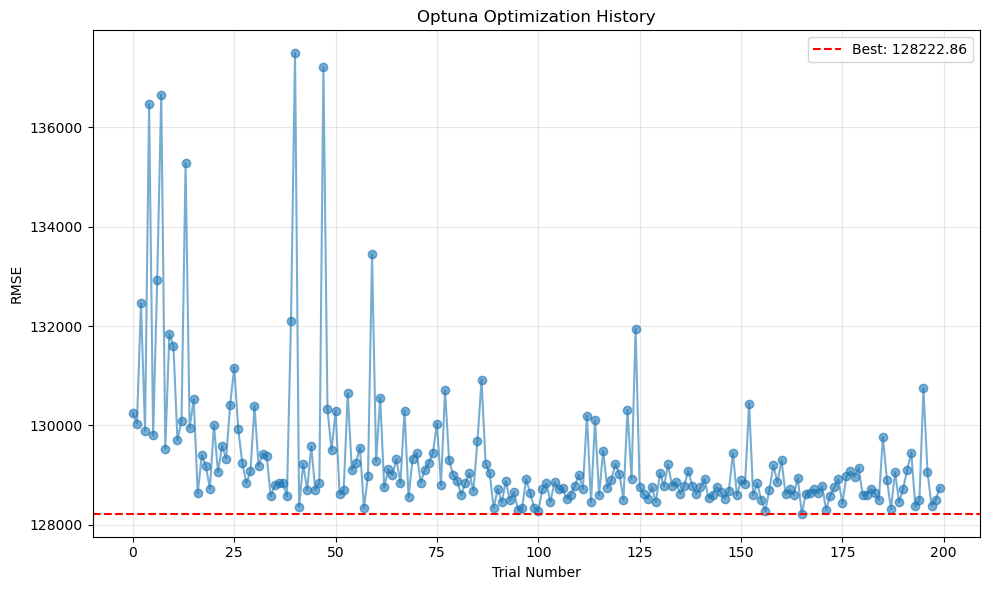

In [41]:
# 1. Find which trial had the best params
print(f"Best trial number: {study.best_trial.number}")
print(f"Best RMSE: {study.best_value}")
print(f"Best parameters: {study.best_params}")

# 2. Plot trial vs value (optimization history)

trial_numbers = [trial.number for trial in study.trials]
trial_values = [trial.value for trial in study.trials]

plt.figure(figsize=(10, 6))
plt.plot(trial_numbers, trial_values, 'o-', alpha=0.6)
plt.axhline(y=study.best_value, color='r', linestyle='--', label=f'Best: {study.best_value:.2f}')
plt.xlabel('Trial Number')
plt.ylabel('RMSE')
plt.title('Optuna Optimization History')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [2]:
# Train final model with best params

best_model = lgb.LGBMRegressor(
    **{'n_estimators': 1156, 'learning_rate': 0.10763245775290799, 'num_leaves': 143, 'max_depth': 17, 'min_child_samples': 20, 'subsample': 0.8531853409366144, 'colsample_bytree': 0.5670837178989158},
    objective='huber',
    alpha=0.9,
)
best_model.fit(X_train_full, Y_train_full_log, categorical_feature=categorical_features)

NameError: name 'lgb' is not defined

In [12]:
#Evaluate model performance
Y_pred_log = best_model.predict(X_test)
Y_pred = np.exp(Y_pred_log)
rmse = mean_squared_error(Y_test, Y_pred, squared=False)
mean_price = Y_test.mean()
rmse_relative = (rmse / mean_price) * 100
mae = mean_absolute_error(Y_test, Y_pred)
mae_relative = (mae / mean_price) * 100
r2 = r2_score(Y_test, Y_pred)

print(f"RMSE: {rmse:.2f}")
print(f"Mean price: {mean_price:.2f}")
print(f"RMSE as percentage of mean price: {rmse_relative:.2f}%")
print(f"MAE: {mae:.2f}")
print(f"MAE as percentage of mean price: {mae_relative:.2f}%")
print(f"R-squared: {r2:.2f}")

RMSE: 123305.86
Mean price: 592617.05
RMSE as percentage of mean price: 20.81%
MAE: 78629.01
MAE as percentage of mean price: 13.27%
R-squared: 0.85


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [13]:
# Calculate tolerance levels
percentage_errors = np.abs((Y_test - Y_pred) / Y_test) * 100

tolerances = [5, 10, 15, 20]

for tol in tolerances:
    within_tol = (percentage_errors <= tol).sum()
    pct = (within_tol / len(Y_test)) * 100
    print(f"Within {tol:2d}%: {pct:5.1f}% ({within_tol}/{len(Y_test)} properties)")



Within  5%:  28.1% (9427/33598 properties)
Within 10%:  52.0% (17476/33598 properties)
Within 15%:  69.2% (23247/33598 properties)
Within 20%:  80.7% (27127/33598 properties)


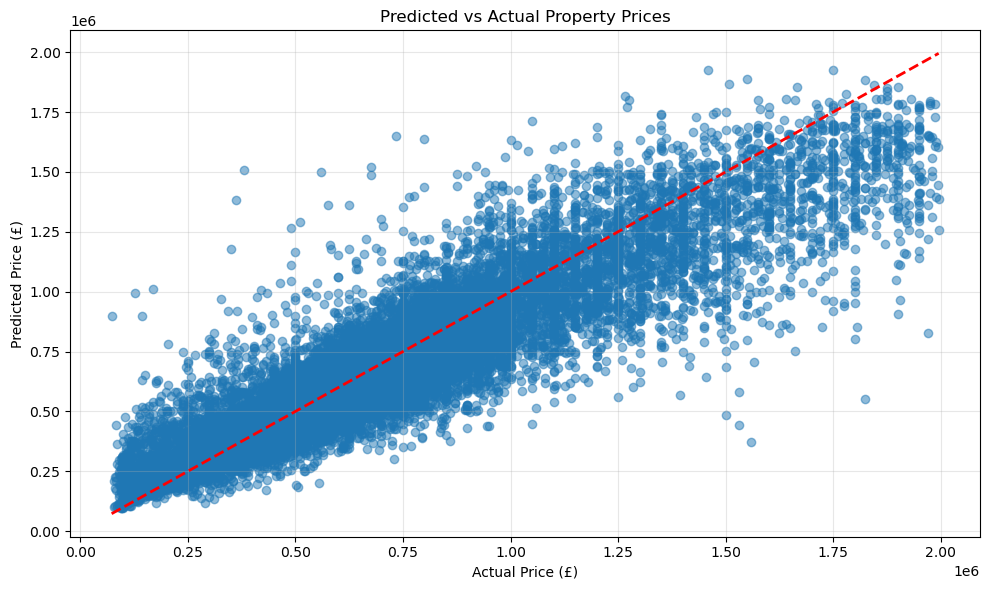

In [14]:
# Plot predicted vs actual
plt.figure(figsize=(10, 6))
plt.scatter(Y_test, Y_pred, alpha=0.5)
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--', lw=2)  # perfect prediction line
plt.xlabel('Actual Price (£)')
plt.ylabel('Predicted Price (£)')
plt.title('Predicted vs Actual Property Prices')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

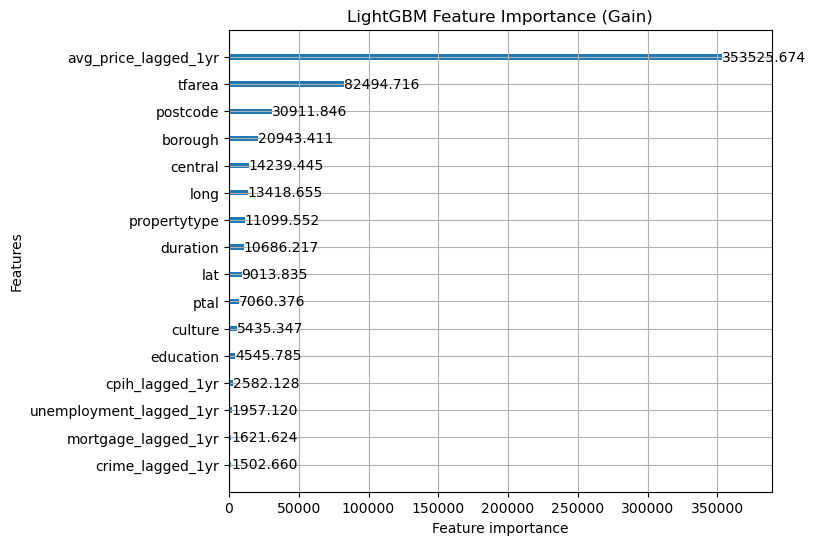

In [15]:
#Feature importance (Gain)
lgb.plot_importance(best_model, importance_type="gain", figsize=(7,6), title="LightGBM Feature Importance (Gain)")
plt.show()

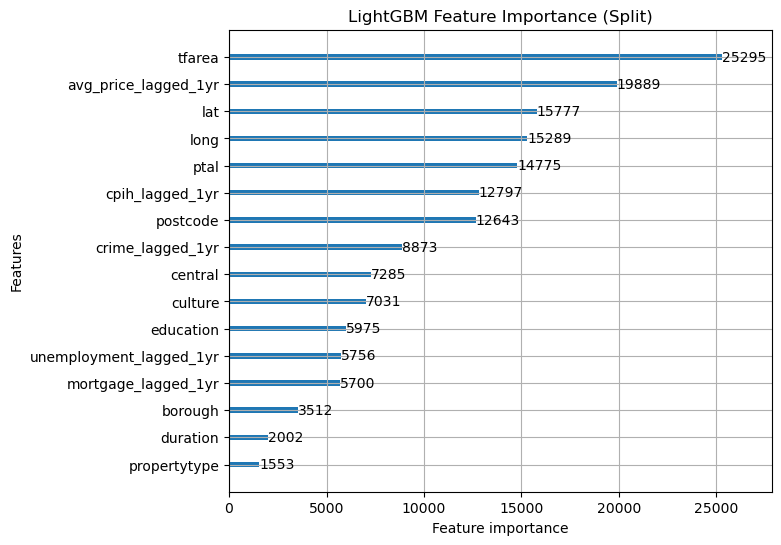

In [16]:
#Feature importance (Split)
lgb.plot_importance(best_model, importance_type="split", figsize=(7,6), title="LightGBM Feature Importance (Split)")
plt.show()

In [17]:
# Error exploration

# Create df
results_df = (
    test_data[['tfarea', 'year', 'postcode', 'price']]
    .copy()
    .join(pd.Series(Y_pred, index=test_data.index, name='predictedprice'))
)
results_df = results_df.rename(columns={'price': 'actualprice'})

# compute absolute percentage error
results_df['ape'] = (results_df.actualprice - results_df.predictedprice).abs() / results_df.actualprice

# compute signed percentage error
results_df['spe'] = (results_df.actualprice - results_df.predictedprice) / results_df.actualprice

print(results_df.head())


        tfarea  year  postcode  actualprice  predictedprice       ape  \
547873    72.0  2024   CR0 1TZ       275000   277367.088201  0.008608   
547874    82.0  2024  SE28 8PF       380000   366000.439607  0.036841   
547875   101.0  2024  TW11 9EX       650000   852488.368791  0.311521   
547876    65.0  2024   HA5 5JS       380000   345259.110970  0.091423   
547877    88.0  2024  NW11 9LT       555000   521883.031058  0.059670   

             spe  
547873 -0.008608  
547874  0.036841  
547875 -0.311521  
547876  0.091423  
547877  0.059670  


In [18]:
# Error distributiuon

results_df['ape'].describe()


count    3.359800e+04
mean     1.399075e-01
std      2.069112e-01
min      8.870910e-07
25%      4.424677e-02
50%      9.519297e-02
75%      1.717435e-01
max      1.129360e+01
Name: ape, dtype: float64

In [19]:
results_df['spe'].describe()

count    33598.000000
mean        -0.006541
std          0.249688
min        -11.293604
25%         -0.073249
50%          0.024369
75%          0.110924
max          0.760806
Name: spe, dtype: float64

Mean is a lot higher than median, so we know that there's a right skew. large outliers dominate RMSE 
- try log target
- huber/segmentation

In [20]:
fig = px.histogram(results_df, x='ape', nbins=80, log_y=True)
fig.update_layout(
    xaxis_title='Absolute Percentage Error (APE)',
    yaxis_title='Count'
)
fig.show()

In [21]:
# RMSE by APE decile

results_df["ape_decile"] = pd.qcut(results_df.ape, 10, labels=False)

rmse_by_decile = (
    results_df.groupby("ape_decile")
      .apply(lambda x: np.sqrt(((x.actualprice - x.predictedprice) ** 2).mean()))
)

decile_summary = (
    results_df.groupby("ape_decile")
    .agg(
        n=("ape", "size"),
        ape_min=("ape", "min"),
        ape_max=("ape", "max"),
        ape_mean=("ape", "mean"),
    )
    .join(rmse_by_decile.rename("rmse"))
)

decile_summary


/var/folders/_6/n4f9pfd14lv1q8nl3892x2v80000gn/T/ipykernel_13188/1647132127.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,n,ape_min,ape_max,ape_mean,rmse
ape_decile,,,,,
0,3360,8.870910e-07,0.017521,0.008684,6232.796105
1,3360,1.752361e-02,0.035502,0.026547,17123.386692
2,3360,3.550200e-02,0.053619,0.044407,27373.753362
3,3359,5.363244e-02,0.072979,0.063181,40661.375734
4,3360,7.297956e-02,0.095192,0.083839,53806.871287
5,3360,9.519356e-02,0.121160,0.107763,72675.529602
6,3359,1.211714e-01,0.152771,0.136254,93865.686352
7,3360,1.527808e-01,0.195714,0.172633,125479.084409
8,3360,1.957385e-01,0.272804,0.229550,178165.841043


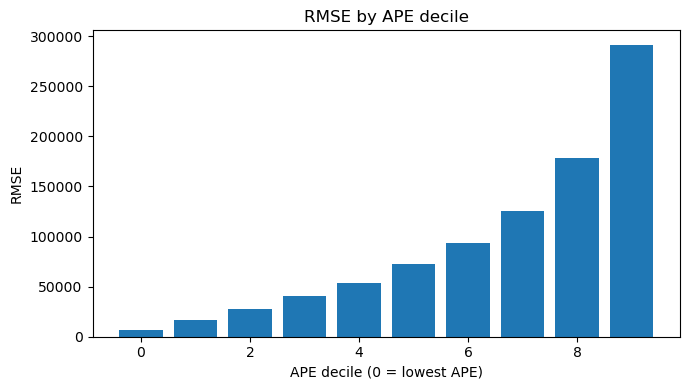

In [22]:
plt.figure(figsize=(7,4))
plt.bar(decile_summary.index, decile_summary["rmse"])
plt.xlabel("APE decile (0 = lowest APE)")
plt.ylabel("RMSE")
plt.title("RMSE by APE decile")
plt.tight_layout()
plt.show()

In [23]:
# Error by price bins

results_df['price_bin'] = pd.qcut(results_df.actualprice, 20, labels=False)
pricebins = results_df.groupby('price_bin')['ape'].mean()
pricebins

price_bin
0     0.447070
1     0.158766
2     0.143214
3     0.126281
4     0.109573
5     0.101963
6     0.098495
7     0.103093
8     0.100563
9     0.111468
10    0.106682
11    0.116469
12    0.115018
13    0.120550
14    0.122647
15    0.130906
16    0.136362
17    0.136944
18    0.142523
19    0.161507
Name: ape, dtype: float64

In [24]:
results_df['price_bin'] = pd.qcut(results_df.actualprice, 20, labels=False)
pricebins = results_df.groupby('price_bin')['spe'].mean()
pricebins

price_bin
0    -0.422611
1    -0.099179
2    -0.061857
3    -0.057218
4    -0.028915
5    -0.020887
6    -0.004987
7     0.002992
8     0.014992
9     0.008290
10    0.034073
11    0.036065
12    0.042714
13    0.036804
14    0.043144
15    0.045398
16    0.057929
17    0.055255
18    0.063221
19    0.139944
Name: spe, dtype: float64

In [25]:
results_df["area_q"] = pd.qcut(results_df.tfarea, 20, labels=False)

areabins = results_df.groupby("area_q")["ape"].mean()
areabins


area_q
0     0.144446
1     0.156427
2     0.163783
3     0.144753
4     0.145831
5     0.149971
6     0.139821
7     0.136263
8     0.144276
9     0.132431
10    0.131183
11    0.129417
12    0.124493
13    0.130423
14    0.143960
15    0.133273
16    0.137312
17    0.127583
18    0.141980
19    0.141402
Name: ape, dtype: float64

In [26]:
results_df["area_q"] = pd.qcut(results_df.tfarea, 20, labels=False)

areabins = results_df.groupby("area_q")["spe"].mean()
areabins

area_q
0    -0.021335
1    -0.018097
2    -0.032399
3    -0.019575
4    -0.007818
5    -0.021682
6    -0.006490
7    -0.008332
8    -0.002678
9    -0.007430
10   -0.010137
11    0.002632
12    0.008483
13    0.013985
14   -0.000913
15    0.000289
16    0.007959
17    0.002620
18   -0.005497
19   -0.001492
Name: spe, dtype: float64

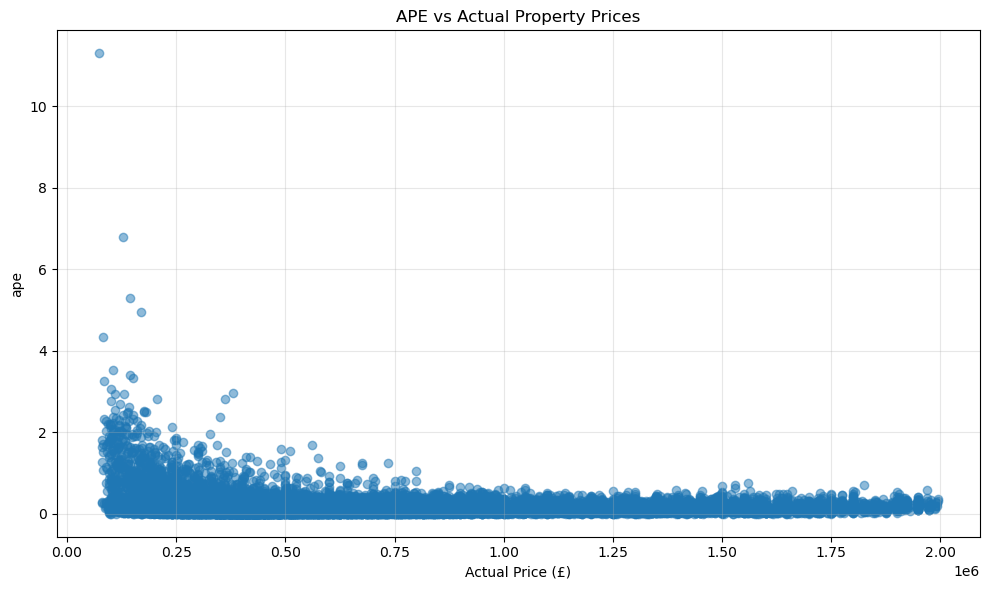

In [27]:
# Plot predicted vs actual
plt.figure(figsize=(10, 6))
plt.scatter(results_df['actualprice'], results_df['ape'], alpha=0.5)
# plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--', lw=2)  # perfect prediction line
plt.xlabel('Actual Price (£)')
plt.ylabel('ape')
plt.title('APE vs Actual Property Prices')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

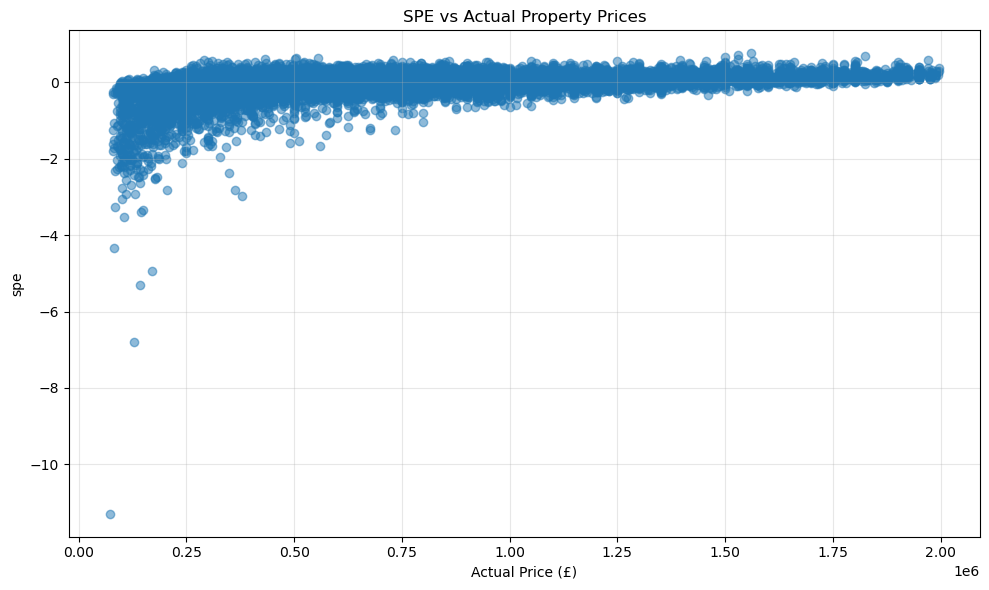

In [28]:
# Plot predicted vs actual
plt.figure(figsize=(10, 6))
plt.scatter(results_df['actualprice'], results_df['spe'], alpha=0.5)
# plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--', lw=2)  # perfect prediction line
plt.xlabel('Actual Price (£)')
plt.ylabel('spe')
plt.title('SPE vs Actual Property Prices')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [29]:

fig = px.histogram(all_data, x='price', nbins=120, title='Actual Price Distribution')
fig.show()

In [1]:


grp = results_df.groupby(pd.qcut(results_df['actual_price'], 20))['spe'].mean()
grp.plot()


NameError: name 'results_df' is not defined